# Library

In [1]:
# Ignore the warnings
import warnings
# warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# System related and data input controls
import os

# Python path
import sys
base_folder = 'DataScience'
location_base = os.path.join(os.getcwd().split(base_folder)[0], base_folder)
location_module = [os.path.join(location_base, 'Module')] 
for each in location_module:
    if each not in sys.path:
        sys.path.append(each)

# Auto reload of library
%reload_ext autoreload
%autoreload 2

from import_KK import *
DeviceStrategy_CPU()
# DeviceStrategy_GPU()
from preprocessing_KK import *
from preprocessing_project_KK import *
from description_KK import *
from algorithm_machinelearning_KK import *
from algorithm_deeplearning_KK import *
from evaluation_KK import *
from visualization_KK import *

JAVA is in the system path?:  False
JAVA is in the system path?:  Adding...
Operation Machine:  AMD64 Family 26 Model 96 Stepping 0, AuthenticAMD
Operation Platform:  64bit
OS Type:  Windows
OS Version:  11
Python Version:  3.13.9 | packaged by Anaconda, Inc. | (main, Oct 21 2025, 19:09:58) [MSC v.1929 64 bit (AMD64)]


AttributeError: module 'torch.fx.experimental.sym_node' has no attribute 'DynamicInt'

# Hyperparameters

In [2]:
# Data
# FOLDER_GDM, FOLDER_GDS = get_google_drivelocation(gdrive='z', glocation=os.path.join('Research', 'SavedData', 'MDIS-OldAdult'))
# FOLDER_LOCATION = FOLDER_GDM
FILENAME = '50_12m_features_final.csv'
# FILE_LOCATION = os.path.join(FOLDER_LOCATION, FILENAME)
LANGUAGE = 'kr'

# Preprocessing
Y_colname = 'y'
T_colname = None
X_reverse = None
X_nullmax = None
X_nullmin = None
X_dummy = None
X_encoding = None
X_delYrelated = None
X_del = ['case_id', 'inv_cty', 'iso2', 'hs6', 'p_ad_yyyymm']
WINSORIZE_LIMITS = (0.01, 0.01)

TEST_SIZE = 0.2
YEAR_VAL, YEAR_TEST = 1, 1 # Execute when TEST_SIZE = 'Time'
RANDOM_STATE = 123
CLASS_STAT = True
## 'RandomUnderSampler' <<< 'TomekLinks' << 'CondensedNearestNeighbour' < 'OneSidedSelection'
## 'SMOTE' <<< 'SMOTETomek' << 'BorderlineSMOTE' < 'ADASYN', 'auto'
# SAMPLING_METHOD = 'ADASYN'
SAMPLING_METHOD = 'auto'
## 'minority', 'not majority', 'not minority', 'all', 'auto'
SAMPLING_STRATEGY = 'auto'    # 'minority', 'not majority', 'not minority', 'all', 'auto'
SCALER = 'minmax'
LABEL_LIST = ['Non-Suicide', 'Suicide']

# Model
ALGO_NAMES_ML = ['Logistic Regression', 'Random Forest', 'XGBoost', 'LightGBM', 'CatBoost']
ALGO_NAMES_DL = ['MLP', 'CNN']
## Common
TUNE_TRIALS_ML = 100
TUNE_TRIALS_DL = 20
CV_SPLITS = 5
TUNE_METRIC_ML = 'F1-score' # Default('auto'): 'F1-score', 'RMSE' - 접두사 없어도 자동으로 validation set 기준으로 판단TUNE_METRIC = 'auto'
TUNE_METRIC_DL = 'val_F1-score' # 'AUC', 'Accuracy', 'F1-score', 'loss', 'val_AUC', 'val_Accuracy', 'val_F1-score', 'val_loss'
METRIC_FINAL = "F1-score"
## DL
tf.random.set_seed(123)
NODE_MLP = [128, 256, 128, 64, 32, 10]
NODE_CNN = [32, 64, 128]
VALIDATION_SPLIT = 0.2
if VALIDATION_SPLIT != None:
    VALIDATION_DATA = None
BATCH_SIZE = 64
EPOCHS = 1000
VERBOSE = 0
## XAI
SHAP = True
INTERACTION = True
INTERACTION_SAMPLES = 5000
INTERACTION_BATCH = 100
X_TOP_DISPLAY = 50
## Causal Inference
if T_colname != None:
    CAUSAL_CRITERION = 'het'
    CAUSAL_HONEST = True
    CAUSAL_INFERENCE = True

# Save
SAVE_NAME_PREDSTATTR = 'DescriptiveStatistics_BinaryPredTrain.csv'
SAVE_NAME_PREDSTATTE = 'DescriptiveStatistics_BinaryPredTest.csv'
SAVE_NAME_ML = 'Performance_ML'
SAVE_NAME_DL = 'Performance_DL'
SAVE_NAME_PERFORMANCE = 'Performance.csv'
SAVE_FOLDER_BASE = os.path.join('.', 'Result', 'Base')
SAVE_FOLDER_TEST = os.path.join('.', 'Result', 'Test')

# Data Preprocessing

In [3]:
# 데이터로딩
df_raw = pd.read_csv(FILE_LOCATION, encoding='cp949')


Preprocessing for Data Prepare...
Initial Shape:  (10078, 784)

Deleting Non-meaning Variables...
Shape of Data:  (9951, 396)

Object X Features:  []
Complete X Object Processing!
0:00:00

Preprocessing for Learning...
자살 생각 여부
0    9436
1     515
Name: count, dtype: int64

Preprocessing NAN...
Column Deleting...
These  2.570694087403599 %( 10 ) columns are containing more than  50.0 % null values!: ['응답자2 응답 노인과의 관계', '낙상_지난 1년 간 낙상 경험 횟수', '경로당_이용 빈도(회)_(일주일 기준)', '노인복지관_이용 빈도(회)_(일주일 기준)', '사회복지관^ 장애인복지관 등_이용 빈도(회)_(일주일 기준)', '노인교실_이용 빈도(회)_(일주일 기준)', '공공 교육여가문화시설_이용 빈도(회)_(일주일 기준)', '민간 교육여가문화시설_이용 빈도(회)_(일주일 기준)', '주당 사용 일수_컴퓨터', '주당 사용 일수_스마트워치']

These  1 columns are containing just 1 unique value!: ['응답자 응답유형']

Row Deleting...

Filling Null Values...


  0%|          | 0/1 [00:00<?, ?it/s]


Shape of Data:  (9951, 378)
Complete of fillna!
(7960, 378) (7960, 1)
(1991, 378) (1991, 1)
Data Split!


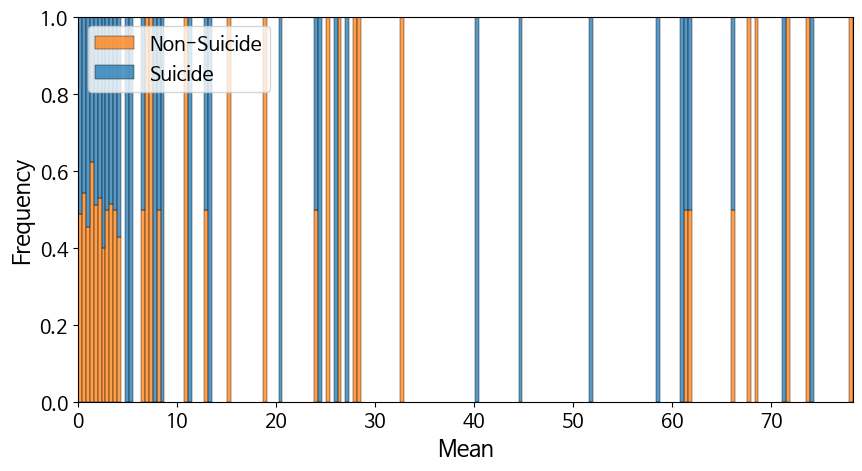

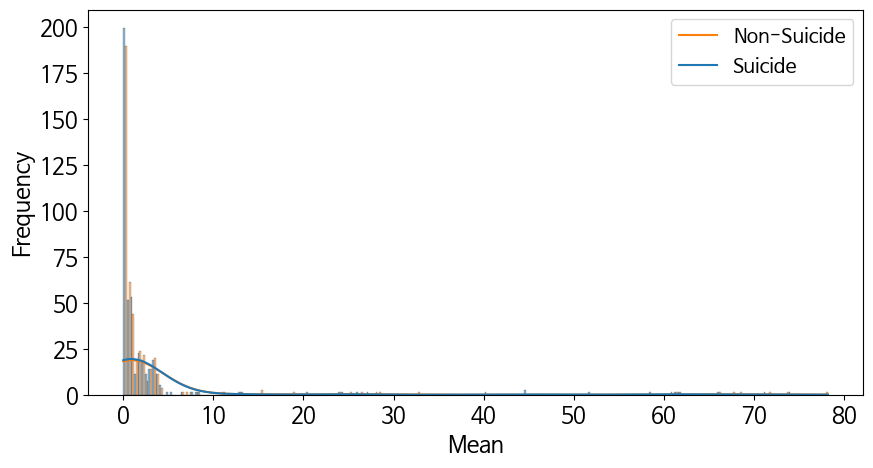

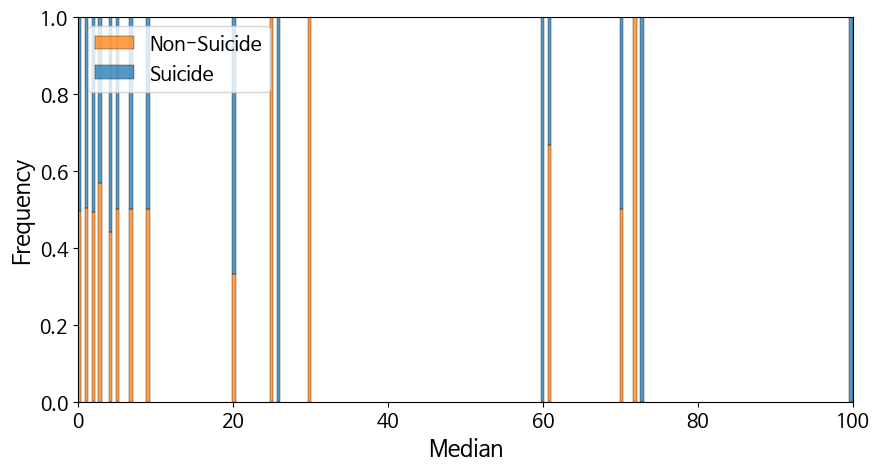

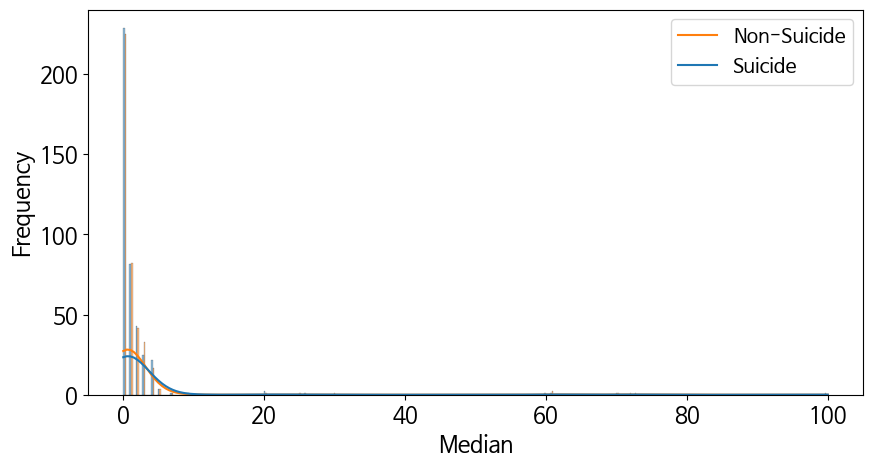

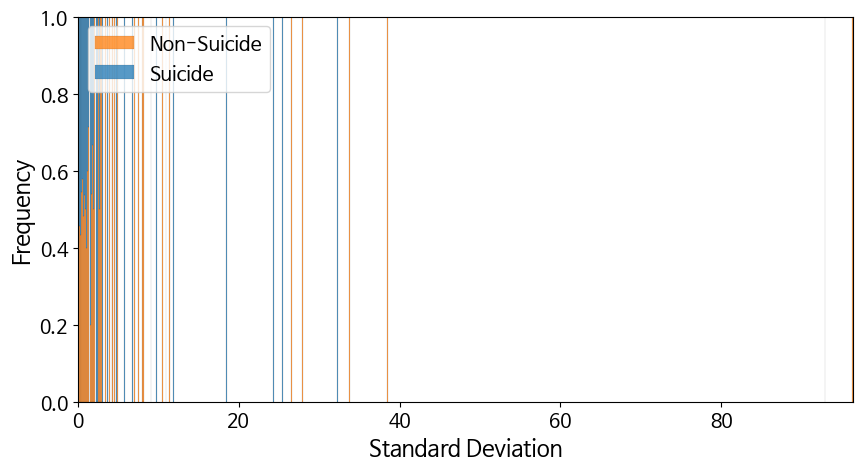

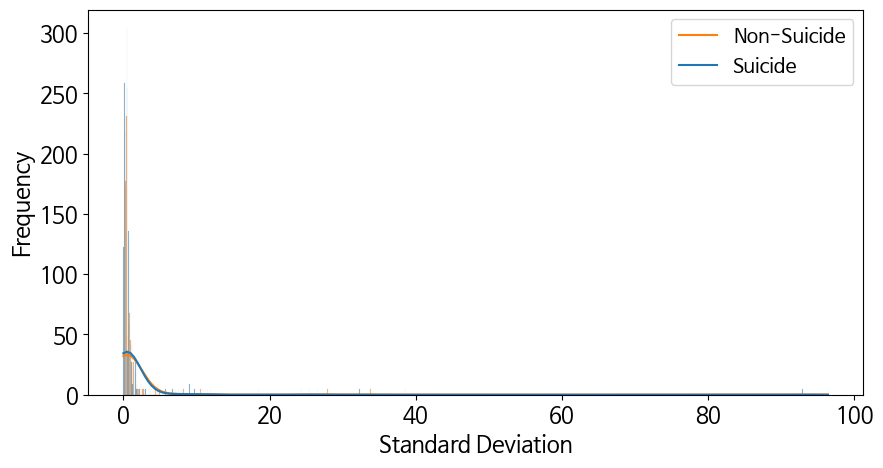

Number of significant features:  243 (0.6428571428571429%)


Non-Suicide      Suicide  \
본인_총수입액_금액                 0.0000     186 (97.38%)    5 (2.62%)   
                           36.0000     12 (92.31%)    1 (7.69%)   
                           50.0000     36 (92.31%)    3 (7.69%)   
                           100.0000    71 (97.26%)    2 (2.74%)   
                           116.0000     1 (50.00%)   1 (50.00%)   
...                                            ...          ...   
의사진단 만성질환 여부_간경변증          1.0000      27 (96.43%)    1 (3.57%)   
도움 주체_ 그 외 공적 돌봄서비스        1.0000      30 (93.75%)    2 (6.25%)   
전자기기 활동여부_게임               1.0000    1256 (94.79%)   69 (5.21%)   
손자녀(10세 미만) 돌봄 여부(지난 1년 간) 1.0000     468 (94.74%)   26 (5.26%)   
죽음준비_장지(자연장지^ 봉안당^ 묘지 등)   1.0000    1999 (94.83%)  109 (5.17%)   

                                                    Statistics  
본인_총수입액_금액                 0.0000    $\chi^2$=515.86, $p$=0.00  
                           36.0000                              
                           50.0000                              
                           100.0000                             
                           116.0000                             
...                                                        ...  
의사진단 만성질환 여부_간경변증          1.0000                               
도움 주체_ 그 외 공적 돌봄서비스        1.0000                               
전자기기 활동여부_게임               1.0000                               
손자녀(10세 미만) 돌봄 여부(지난 1년 간) 1.0000                               
죽음준비_장지(자연장지^ 봉안당^ 묘지 등)   1.0000                               

[3756 rows x 3 columns]

Comparison Statistics of X by Y class!
auto
Undersampling...
(7960, 378) (7960, 1)
Ratio of Origin Y:  자살 생각 여부
0           7537
1            423
Name: count, dtype: int64
(846, 378) (846, 1)
Ratio of Sampling Y:  자살 생각 여부
0           423
1           423
Name: count, dtype: int64

Preprocessing of Scaling...
(846, 378) (846, 1) 0.0 1.0000000000000002
(184, 378) (184, 1) -0.7142857142857144 2.0
Complete!
0:00:06


In [4]:
# 전처리
X_train, X_test, Y_train, Y_test, df_prep, X_colname, scaler_dict, CV_SPLITS = preprocessing_mdis_EA(
    df_raw, 
    X_delete=X_del,
    Y_colname=Y_colname,
    test_size=TEST_SIZE,
    year_val=YEAR_VAL, year_test=YEAR_TEST,
    cv_splits=CV_SPLITS,
    class_stat=CLASS_STAT, 
    sampling_method=SAMPLING_METHOD,
    sampling_strategy=SAMPLING_STRATEGY,
    scaler=SCALER,
    label_list=LABEL_LIST,
    language=LANGUAGE,
)

# Modeling

## Machine Learning

▶ Detected Task Type: [ classification ] (Target: binary)

   Running Machine Learning Algorithm: Logistic Regression (classification)
Learning...:  2026-06-14 00:57:42.793622


  0%|          | 0/100 [00:00<?, ?it/s]

[Logistic Regression] Best Optuna Score (F1-score):  0.722193584250381
[Logistic Regression] Best Tuning Parameters:  {'solver': 'liblinear', 'penalty': 'l1', 'C': 0.23241130644926786, 'class_weight': 'balanced', 'max_iter': 953, 'random_state': 123}

Explanations...:  2026-06-14 00:58:59.375378
Explanations of Y:


,Features,Coef,Features,Coef
0,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_대중교통 이용 시,0.8764,좋은 죽음_임종시 가족이나 가까운 지인이 함께 하는 것,-1.1316
1,영양관리_채소 미섭취,0.6420,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_상업시설 이용 시,-0.7638
2,죽음준비_유서 작성,0.6019,최근 3년 간 선거 투표 참여 여부,-0.5443
3,컴퓨터 보유 여부,0.5841,지역사회 환경 만족도_주변 도로의 보행 안전,-0.4760
4,현재 경제활동 여부,0.4613,정부운영기관/서비스 인지 여부_호스피스·완화의료 사업,-0.4113
...,...,...,...,...
350,도움의 충분도,0.0000,NaN,NaN
351,도움 주체_ 그 외 공적 돌봄서비스,0.0000,NaN,NaN
352,도움 주체_ 노인맞춤돌봄서비스,0.0000,NaN,NaN
353,도움 주체_ 장기요양보험서비스,0.0000,NaN,NaN


Performance Evaluations...:  2026-06-14 00:58:59.381862
Performance: 


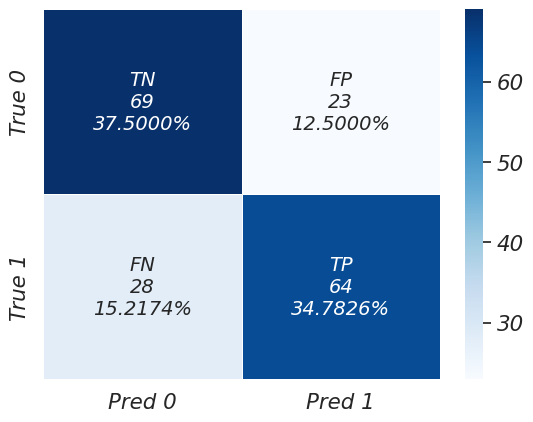

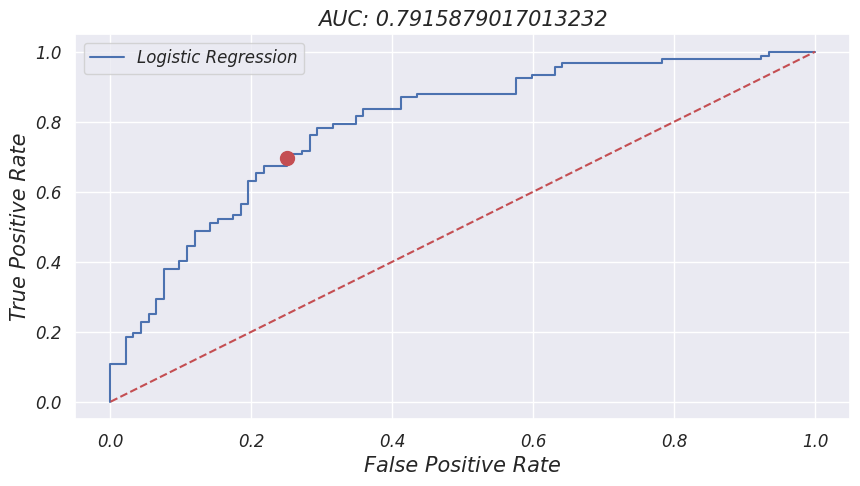

,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Logistic Regression,Train set,846,328,344,79,95,0.8059,0.7754,0.8132,0.7904,0.7943,0.7943,0.8757
1,Logistic Regression,Validation(CV),846,293,317,106,130,0.7474,0.6999,0.7636,0.7222,0.7317,0.7318,0.7978
2,Logistic Regression,Test set,184,64,69,23,28,0.7356,0.6957,0.7500,0.7151,0.7228,0.7228,0.7916
3,Logistic Regression,Entire population,1030,392,413,102,123,0.7935,0.7612,0.8019,0.7770,0.7816,0.7816,0.8607


   [Save] Logistic Regression Checkpoint Saved:
     - Model : /mnt/c/DataScience/Publication/202604_SuicidalIdeation_OldAdult/Model/best_model_Logistic Regression_20260614_005900.pkl
     - Params: /mnt/c/DataScience/Publication/202604_SuicidalIdeation_OldAdult/Model/best_params_Logistic Regression_20260614_005900.json

   Running Machine Learning Algorithm: Random Forest (classification)
Learning...:  2026-06-14 00:59:00.805801


  0%|          | 0/100 [00:00<?, ?it/s]

[Random Forest] Best Optuna Score (F1-score):  0.7644705179560132
[Random Forest] Best Tuning Parameters:  {'n_estimators': 350, 'max_depth': 27, 'max_features': 'log2', 'min_samples_split': 11, 'min_samples_leaf': 3, 'bootstrap': False, 'random_state': 123, 'n_jobs': -1, 'class_weight': None}

Explanations...:  2026-06-14 01:03:37.948368
Explanations of Y:


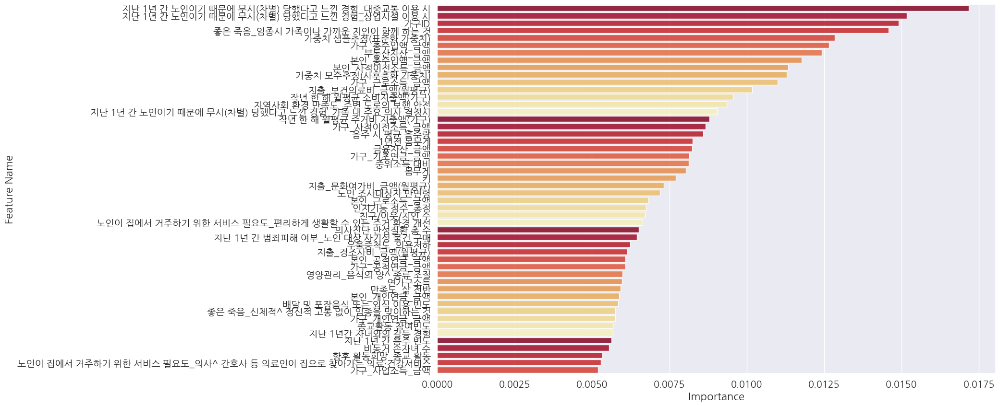

Performance Evaluations...:  2026-06-14 01:03:38.457220
Performance: 


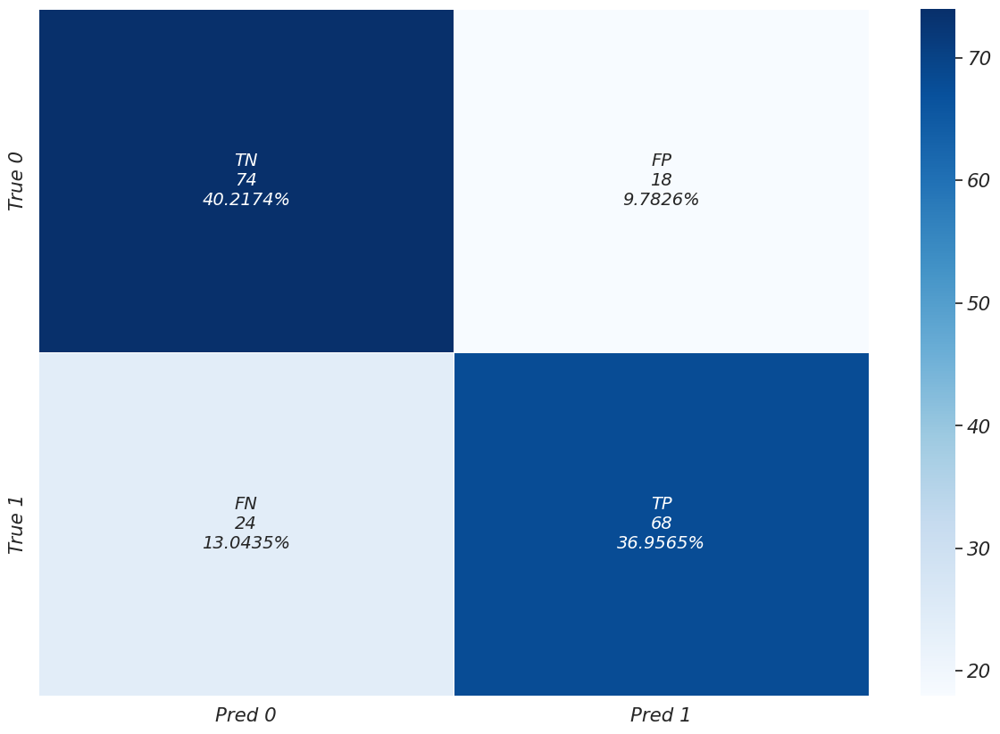

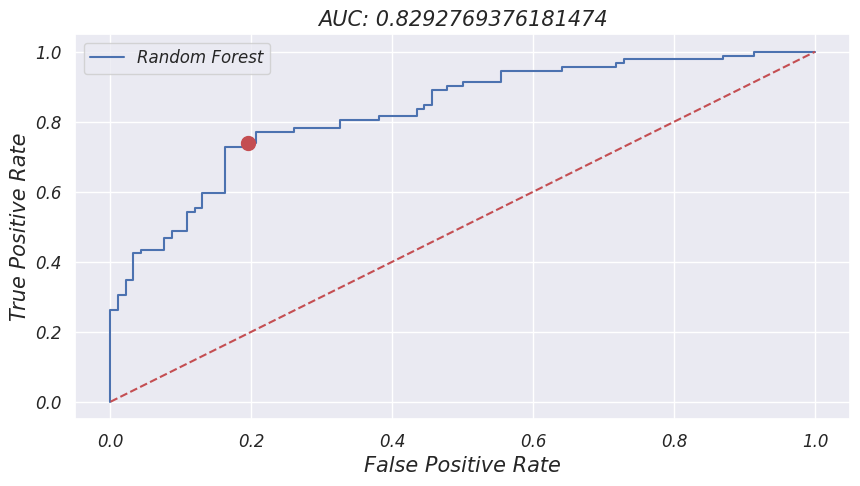

,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Random Forest,Train set,846,423,423,0,0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,Random Forest,Validation(CV),846,306,335,88,117,0.7833,0.7473,0.7943,0.7645,0.7707,0.7708,0.8393
2,Random Forest,Test set,184,68,74,18,24,0.7907,0.7391,0.8043,0.7640,0.7717,0.7717,0.8293
3,Random Forest,Entire population,1030,491,497,18,24,0.9646,0.9534,0.9650,0.9590,0.9592,0.9592,0.9934


   [Save] Random Forest Checkpoint Saved:
     - Model : /mnt/c/DataScience/Publication/202604_SuicidalIdeation_OldAdult/Model/best_model_Random Forest_20260614_010340.pkl
     - Params: /mnt/c/DataScience/Publication/202604_SuicidalIdeation_OldAdult/Model/best_params_Random Forest_20260614_010340.json

   Running Machine Learning Algorithm: XGBoost (classification)
Learning...:  2026-06-14 01:03:40.271140


  0%|          | 0/100 [00:00<?, ?it/s]

[XGBoost] Best Optuna Score (F1-score):  0.7774552216921855
[XGBoost] Best Tuning Parameters:  {'n_estimators': 700, 'max_depth': 3, 'learning_rate': 0.020598447446467136, 'subsample': 0.6691496738282696, 'colsample_bytree': 0.5355622074313471, 'min_child_weight': 5.41549244014279, 'gamma': 2.4631492610756953, 'reg_alpha': 0.010300910464791481, 'reg_lambda': 3.463376426483073, 'random_state': 123, 'n_jobs': -1, 'tree_method': 'hist', 'verbosity': 0, 'scale_pos_weight': 1.9262730279399156}

Explanations...:  2026-06-14 01:11:57.335517
Explanations of Y:


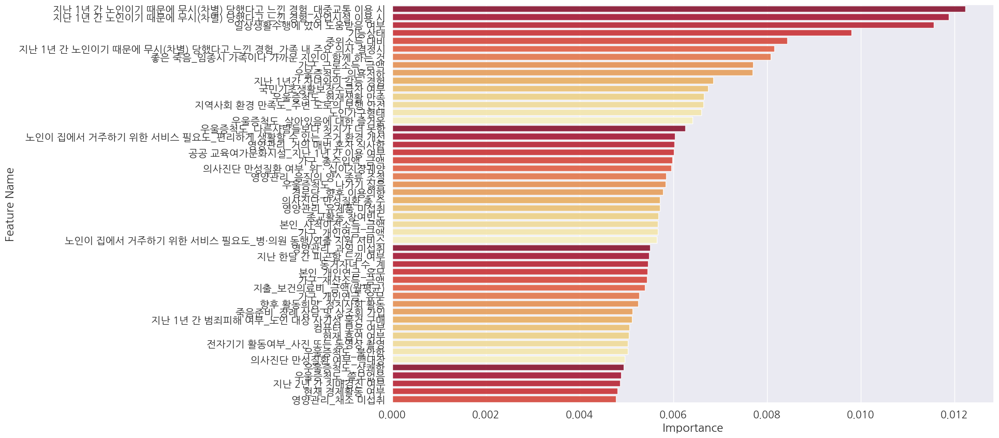

Performance Evaluations...:  2026-06-14 01:11:57.670841
Performance: 


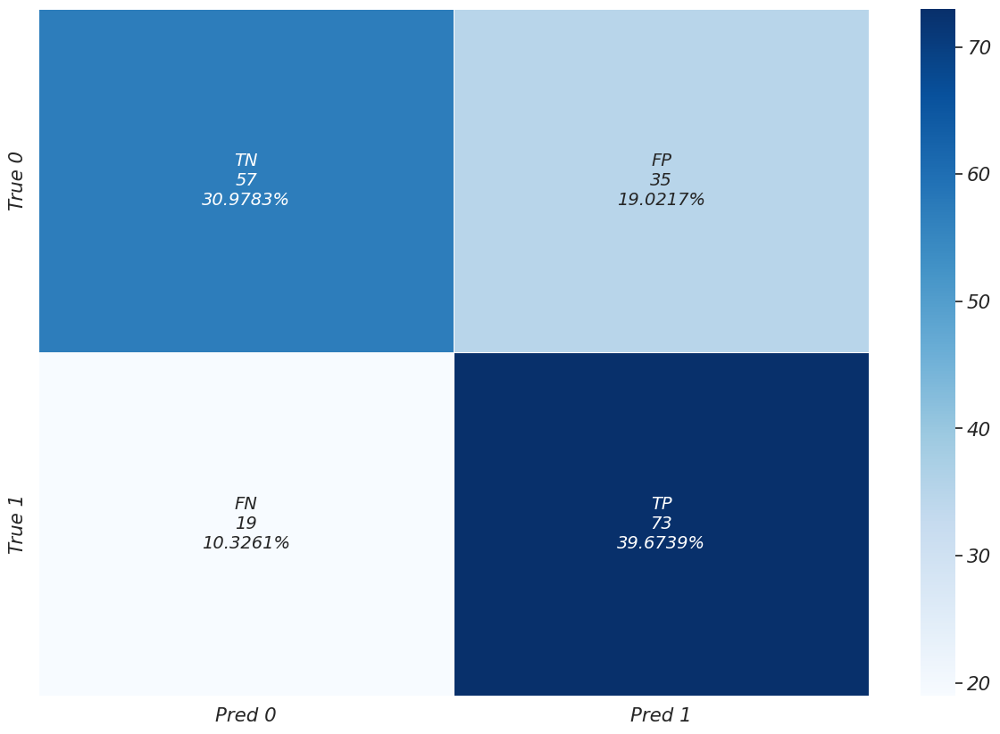

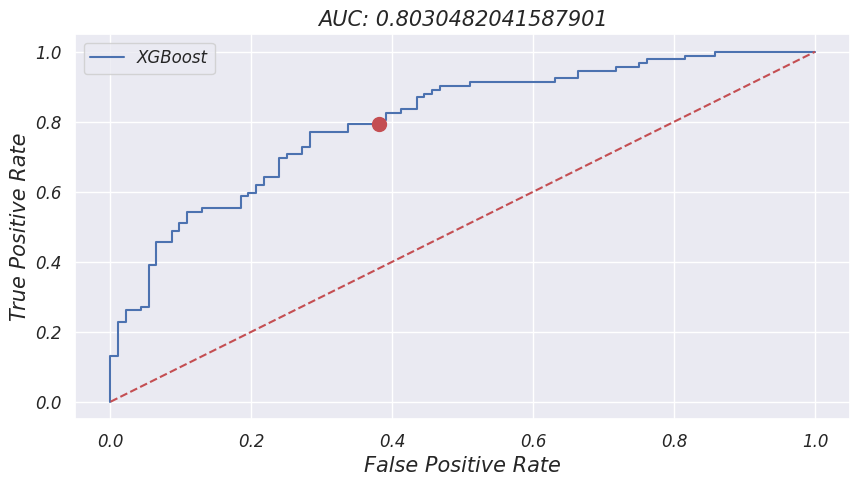

,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,XGBoost,Train set,846,419,374,49,4,0.8953,0.9905,0.8842,0.9405,0.9374,0.9374,0.9922
1,XGBoost,Validation(CV),846,344,269,154,79,0.7213,0.8442,0.6737,0.7775,0.7589,0.7590,0.8355
2,XGBoost,Test set,184,73,57,35,19,0.6759,0.7935,0.6196,0.7300,0.7065,0.7065,0.8030
3,XGBoost,Entire population,1030,492,431,84,23,0.8542,0.9553,0.8369,0.9019,0.8961,0.8961,0.9666


   [Save] XGBoost Checkpoint Saved:
     - Model : /mnt/c/DataScience/Publication/202604_SuicidalIdeation_OldAdult/Model/best_model_XGBoost_20260614_011159.pkl
     - Params: /mnt/c/DataScience/Publication/202604_SuicidalIdeation_OldAdult/Model/best_params_XGBoost_20260614_011159.json

   Running Machine Learning Algorithm: LightGBM (classification)
Learning...:  2026-06-14 01:11:59.661233


  0%|          | 0/100 [00:00<?, ?it/s]

[LightGBM] Best Optuna Score (F1-score):  0.7697866267971583
[LightGBM] Best Tuning Parameters:  {'n_estimators': 950, 'learning_rate': 0.01292276048682411, 'num_leaves': 208, 'max_depth': 14, 'min_child_samples': 69, 'subsample': 0.652239974860691, 'colsample_bytree': 0.7650877845186118, 'min_split_gain': 0.6269237446702067, 'extra_trees': False, 'reg_alpha': 0.00042590162433733353, 'reg_lambda': 2.1461338800151006e-06, 'random_state': 123, 'n_jobs': -1, 'verbose': -1, 'class_weight': None}

Explanations...:  2026-06-14 01:18:04.748358
Explanations of Y:


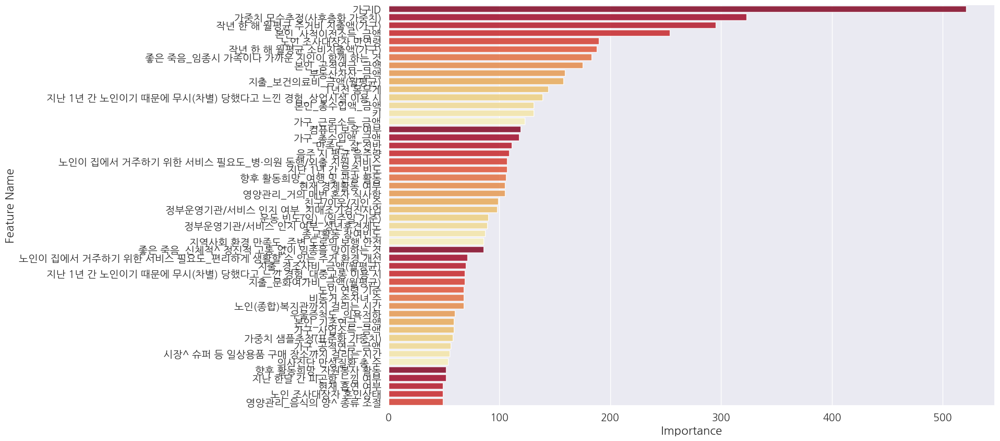

Performance Evaluations...:  2026-06-14 01:18:05.180888
Performance: 


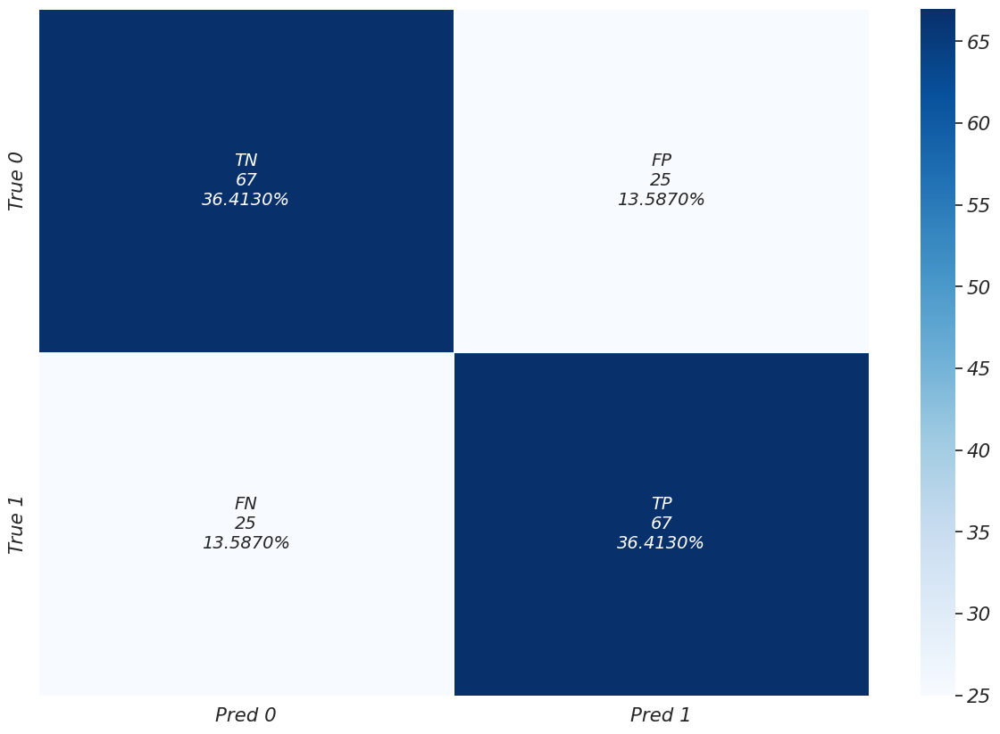

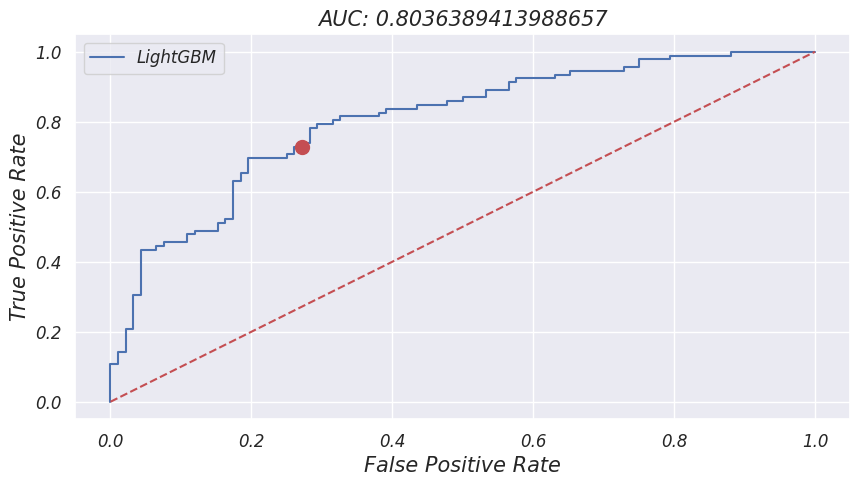

,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,LightGBM,Train set,846,413,411,12,10,0.9718,0.9764,0.9716,0.9741,0.9740,0.9740,0.9977
1,LightGBM,Validation(CV),846,311,320,103,112,0.7770,0.7638,0.7800,0.7698,0.7719,0.7719,0.8273
2,LightGBM,Test set,184,67,67,25,25,0.7283,0.7283,0.7283,0.7283,0.7283,0.7283,0.8036
3,LightGBM,Entire population,1030,480,478,37,35,0.9284,0.9320,0.9282,0.9302,0.9301,0.9301,0.9734


   [Save] LightGBM Checkpoint Saved:
     - Model : /mnt/c/DataScience/Publication/202604_SuicidalIdeation_OldAdult/Model/best_model_LightGBM_20260614_013728.pkl
     - Params: /mnt/c/DataScience/Publication/202604_SuicidalIdeation_OldAdult/Model/best_params_LightGBM_20260614_013728.json

   Running Machine Learning Algorithm: CatBoost (classification)
Learning...:  2026-06-14 01:37:28.639960


  0%|          | 0/100 [00:00<?, ?it/s]

[CatBoost] Best Optuna Score (F1-score):  0.7665175887790896
[CatBoost] Best Tuning Parameters:  {'iterations': 500, 'depth': 4, 'learning_rate': 0.04629334508035828, 'l2_leaf_reg': 7.628412669495168, 'random_state': 123, 'verbose': 0, 'allow_writing_files': False, 'task_type': 'CPU', 'subsample': 0.6745421533042624, 'grow_policy': 'Lossguide'}

Explanations...:  2026-06-14 01:55:58.096752
Explanations of Y:


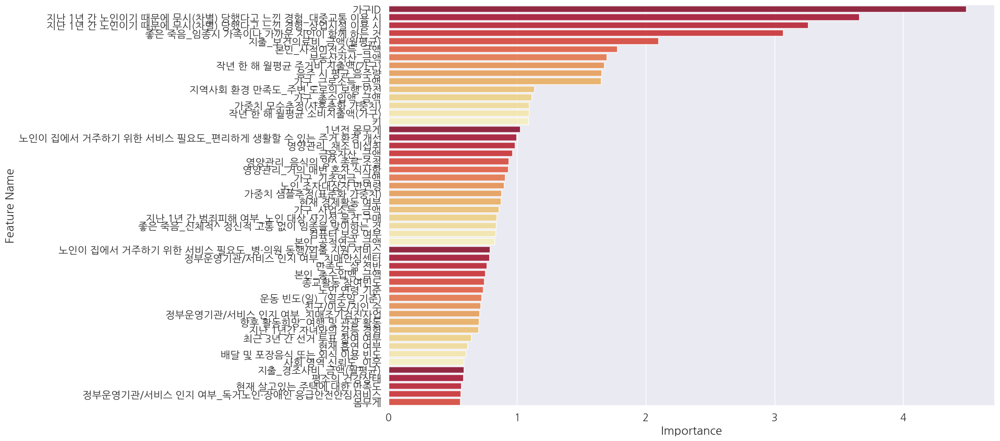

Performance Evaluations...:  2026-06-14 01:55:58.339631
Performance: 


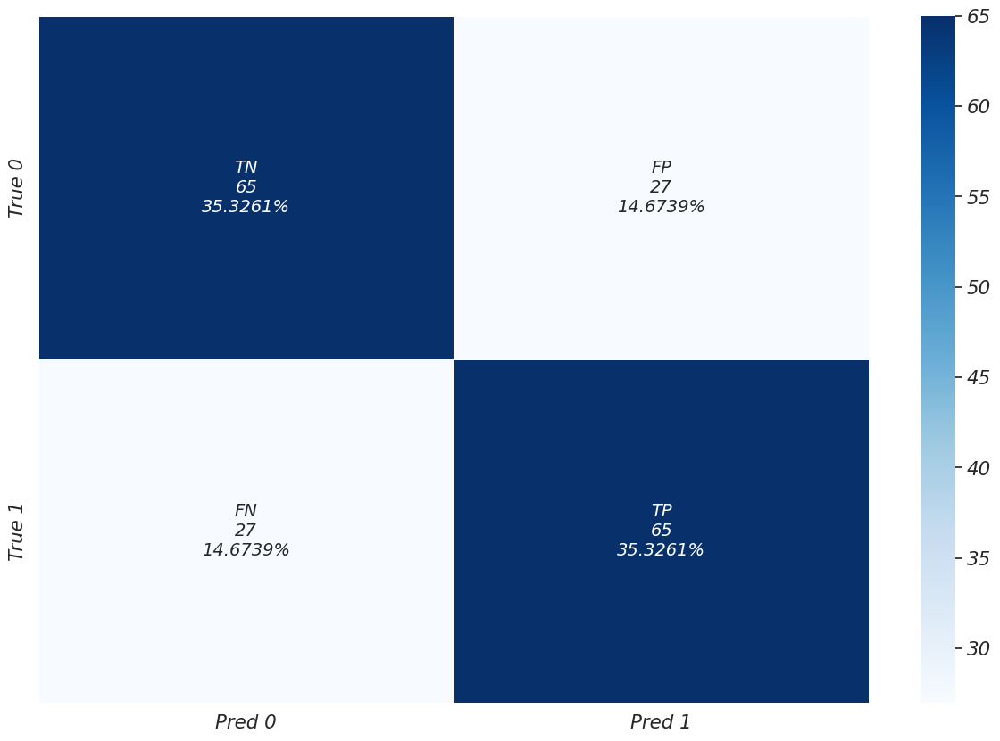

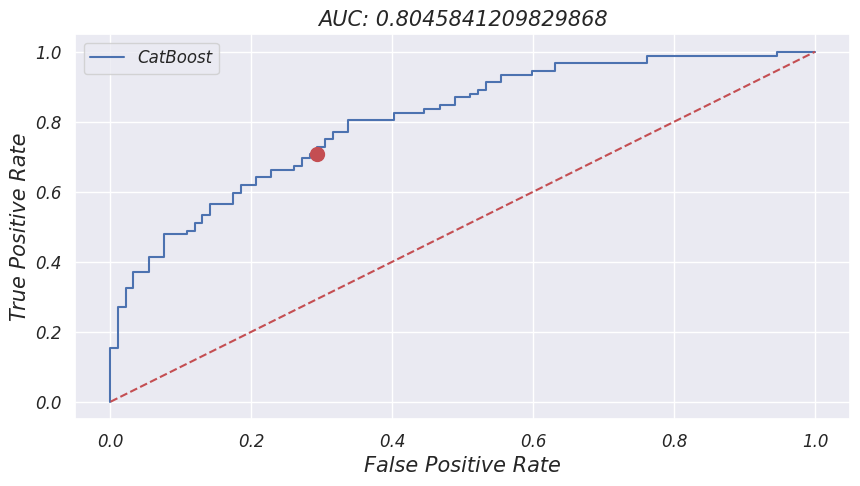

,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,CatBoost,Train set,846,423,423,0,0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,CatBoost,Validation(CV),846,315,323,100,108,0.7706,0.7637,0.7730,0.7665,0.7683,0.7684,0.8431
2,CatBoost,Test set,184,65,65,27,27,0.7065,0.7065,0.7065,0.7065,0.7065,0.7065,0.8046
3,CatBoost,Entire population,1030,488,488,27,27,0.9476,0.9476,0.9476,0.9476,0.9476,0.9476,0.9888


   [Save] CatBoost Checkpoint Saved:
     - Model : /mnt/c/DataScience/Publication/202604_SuicidalIdeation_OldAdult/Model/best_model_CatBoost_20260614_015602.pkl
     - Params: /mnt/c/DataScience/Publication/202604_SuicidalIdeation_OldAdult/Model/best_params_CatBoost_20260614_015602.json

   Modeling Completed. Summary of Performance (classification)


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Logistic Regression,Train set,846,328,344,79,95,0.805897,0.775414,0.813239,0.790361,0.794326,0.794326,0.875671
4,Random Forest,Train set,846,423,423,0,0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
8,XGBoost,Train set,846,419,374,49,4,0.895299,0.990544,0.884161,0.940516,0.937352,0.937352,0.992220
12,LightGBM,Train set,846,413,411,12,10,0.971765,0.976359,0.971631,0.974057,0.973995,0.973995,0.997664
16,CatBoost,Train set,846,423,423,0,0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
1,Logistic Regression,Validation(CV),846,293,317,106,130,0.747417,0.699944,0.763641,0.722194,0.731716,0.731793,0.797849
5,Random Forest,Validation(CV),846,306,335,88,117,0.783333,0.747255,0.794258,0.764471,0.770700,0.770756,0.839256
9,XGBoost,Validation(CV),846,344,269,154,79,0.721348,0.844230,0.673697,0.777455,0.758907,0.758964,0.835506
13,LightGBM,Validation(CV),846,311,320,103,112,0.776999,0.763782,0.780000,0.769787,0.771890,0.771891,0.827334
17,CatBoost,Validation(CV),846,315,323,100,108,0.770566,0.763725,0.772997,0.766518,0.768347,0.768361,0.843102


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
2,Logistic Regression,Test set,184,64,69,23,28,0.735632,0.695652,0.750000,0.715084,0.722826,0.722826,0.791588
6,Random Forest,Test set,184,68,74,18,24,0.790698,0.739130,0.804348,0.764045,0.771739,0.771739,0.829277
10,XGBoost,Test set,184,73,57,35,19,0.675926,0.793478,0.619565,0.730000,0.706522,0.706522,0.803048
14,LightGBM,Test set,184,67,67,25,25,0.728261,0.728261,0.728261,0.728261,0.728261,0.728261,0.803639
18,CatBoost,Test set,184,65,65,27,27,0.706522,0.706522,0.706522,0.706522,0.706522,0.706522,0.804584


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
3,Logistic Regression,Entire population,1030,392,413,102,123,0.793522,0.761165,0.801942,0.777007,0.781553,0.781553,0.860726
7,Random Forest,Entire population,1030,491,497,18,24,0.964637,0.953398,0.965049,0.958984,0.959223,0.959223,0.993428
11,XGBoost,Entire population,1030,492,431,84,23,0.854167,0.955340,0.836893,0.901925,0.896117,0.896117,0.966594
15,LightGBM,Entire population,1030,480,478,37,35,0.928433,0.932039,0.928155,0.930233,0.930097,0.930097,0.973419
19,CatBoost,Entire population,1030,488,488,27,27,0.947573,0.947573,0.947573,0.947573,0.947573,0.947573,0.988836


test
Saved total performance to: /mnt/c/DataScience/Publication/202604_SuicidalIdeation_OldAdult/Result/Performance_ML(Trial100).csv
Saved total parameters to: /mnt/c/DataScience/Publication/202604_SuicidalIdeation_OldAdult/Result/Hyperparams_ML(Trial100).csv
Saved total results object to: /mnt/c/DataScience/Publication/202604_SuicidalIdeation_OldAdult/Model/Best_Result_ML(Trial100).pkl


In [10]:
# ALGO_NAMES_ML = ['CatBoost']

# ML 실행
results_ML, scores_ML = modeling_ML(
    algos=ALGO_NAMES_ML,
    X_train=X_train, Y_train=Y_train, X_test=X_test, Y_test=Y_test,
    X_colname=X_colname,
    params=None, # 특정 알고리즘
    tune_trials=TUNE_TRIALS_ML, # 최적화 여부
    cv_splits=CV_SPLITS,
    tune_metric=TUNE_METRIC_ML,
    shap=not SHAP, 
    X_selected=None, # shap에서만 작동
    interaction=not INTERACTION,
    interaction_samples=INTERACTION_SAMPLES, 
    interaction_batch=INTERACTION_BATCH,
    X_top_display=X_TOP_DISPLAY, 
    label_list=LABEL_LIST,
)

## Deep Learning

▶ Detected Task Type: [ classification ] (Target: binary)

   Running Deep Learning Algorithm: CNN (classification)
[Info] Starting Hyperparameter Optimization (Trials: 20)...


  0%|          | 0/20 [00:00<?, ?it/s]

Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
I0000 00:00:1781410569.836306  636841 service.cc:152] XLA service 0x7e0014021e10 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1781410569.836330  636841 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 3090, Compute Capability 8.6
I0000 00:00:1781410569.836333  636841 service.cc:160]   StreamExecutor device (1): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2026-06-14 13:16:09.948790: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1781410570.232455  636841 cuda_dnn.cc:529] Loaded cuDNN version 90501
I0000 00:00:1781410573.938620  636841 device_compiler.h:188] Compiled cluster using XLA!  This 

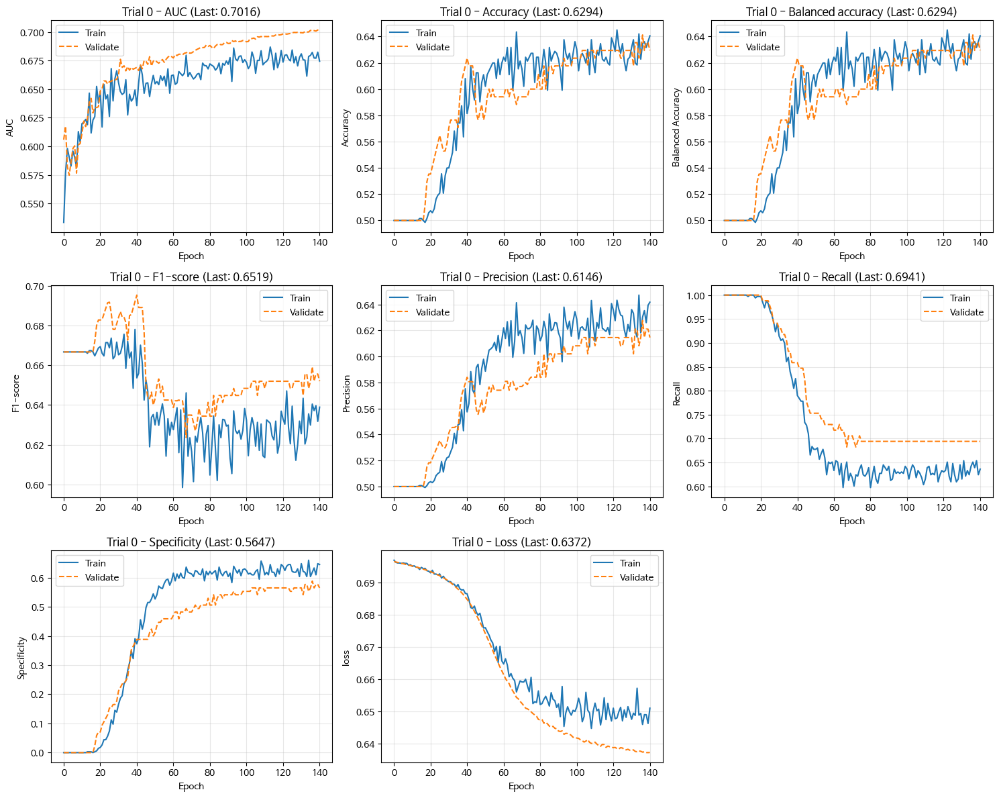

Training Progress:  14%|████████▌                                                    | 141/1000 [02:20<14:17,  1.00it/s]


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

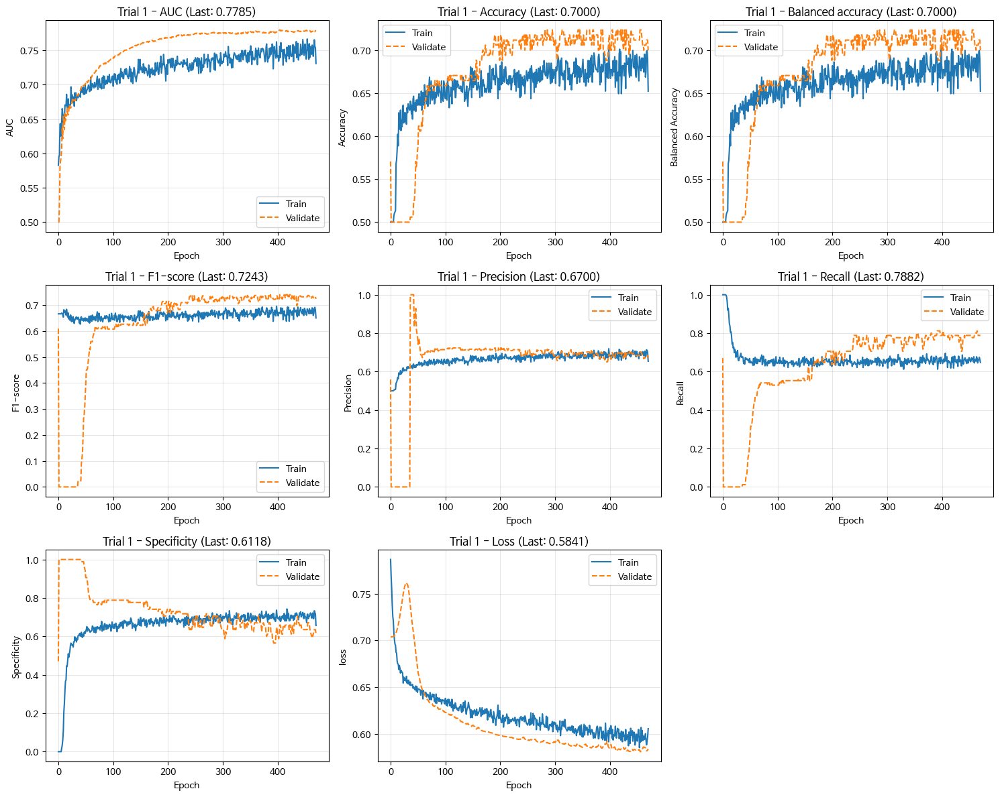

Training Progress:  47%|████████████████████████████▋                                | 471/1000 [06:59<07:51,  1.12it/s]


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

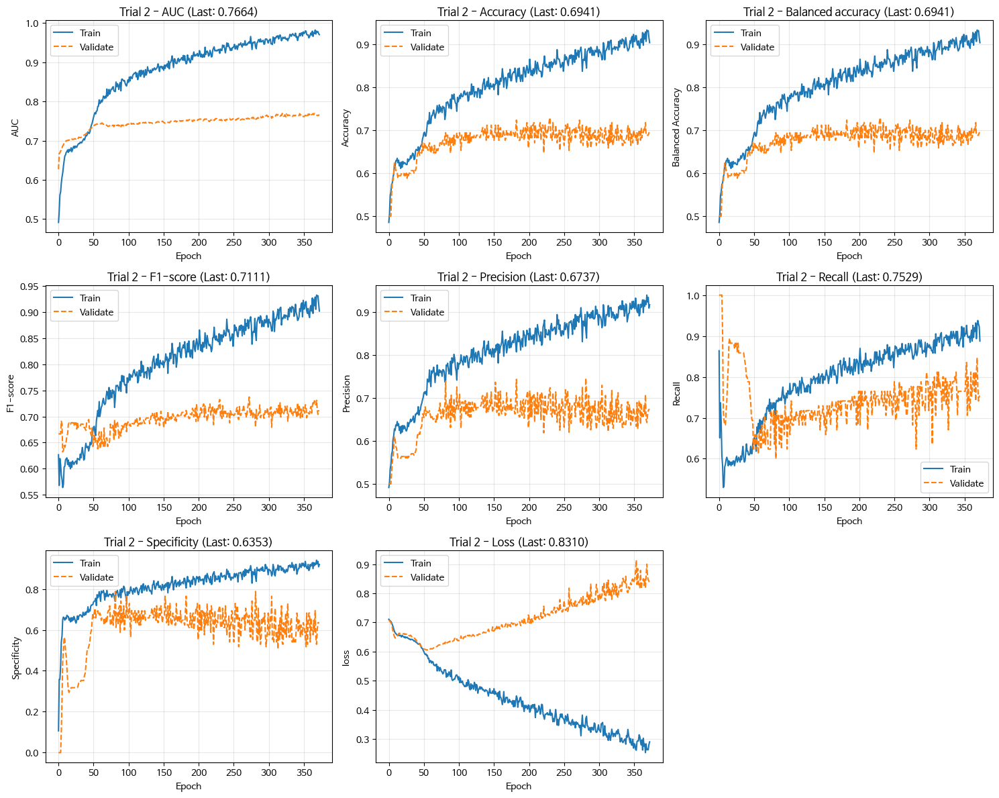

Training Progress:  37%|██████████████████████▊                                      | 373/1000 [06:23<10:45,  1.03s/it]


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

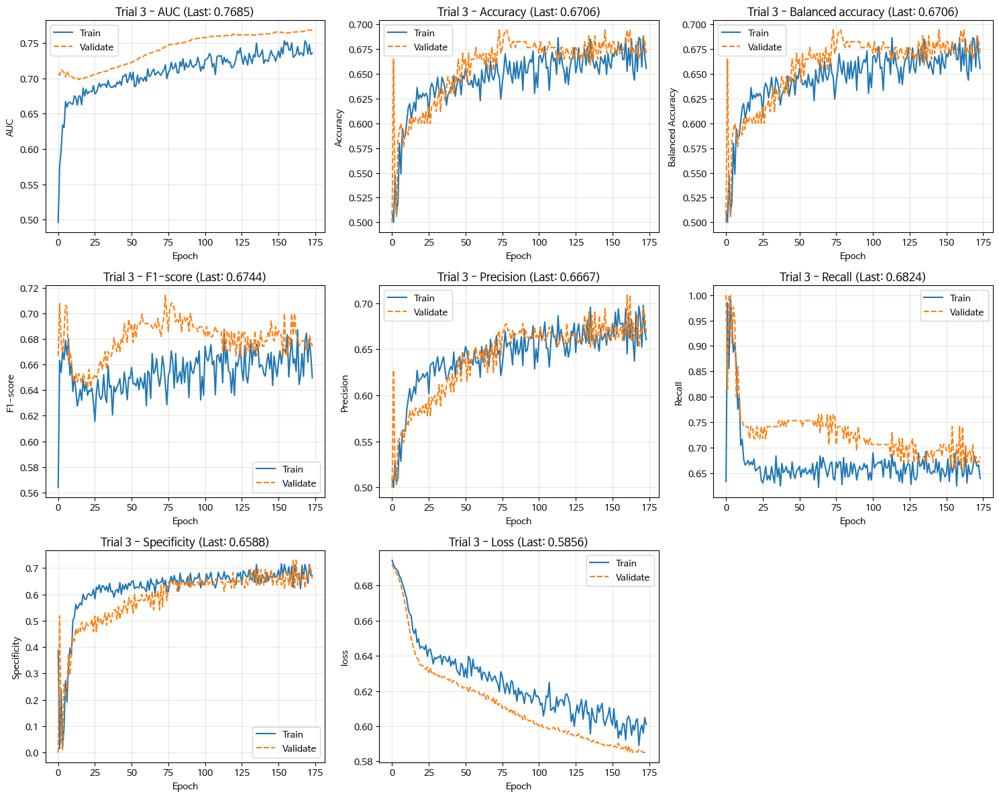

Training Progress:  17%|██████████▌                                                  | 174/1000 [02:40<12:41,  1.08it/s]


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

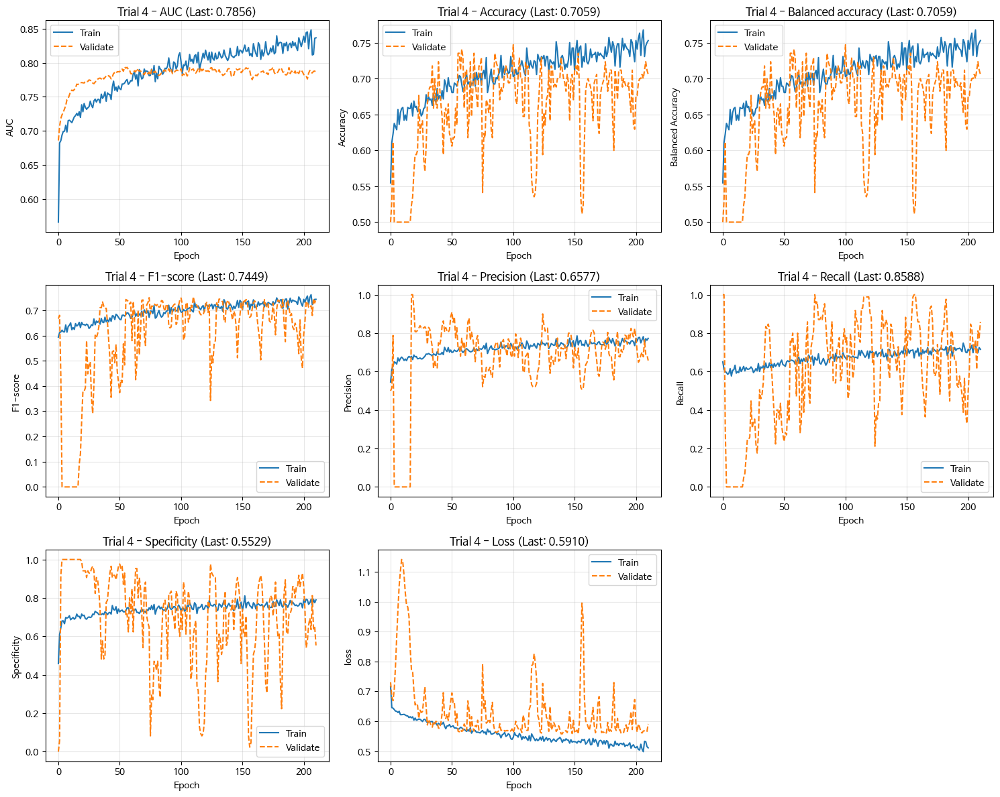

Training Progress:  21%|████████████▊                                                | 211/1000 [03:21<12:32,  1.05it/s]


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

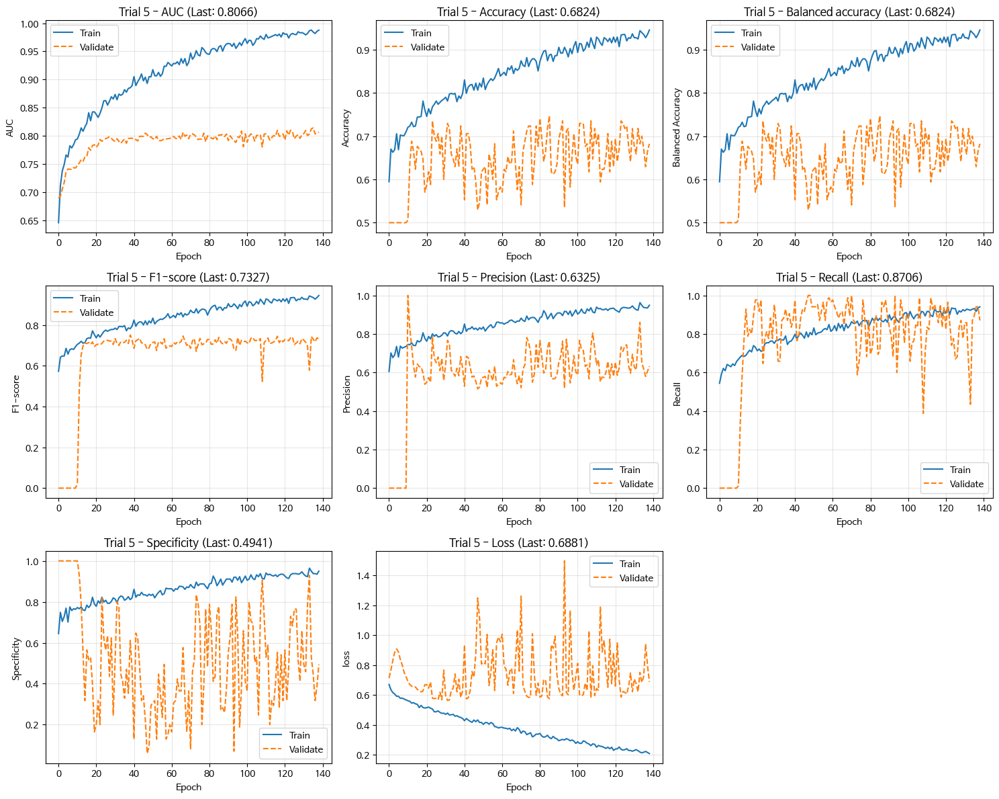

Training Progress:  14%|████████▍                                                    | 139/1000 [02:19<14:26,  1.01s/it]


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

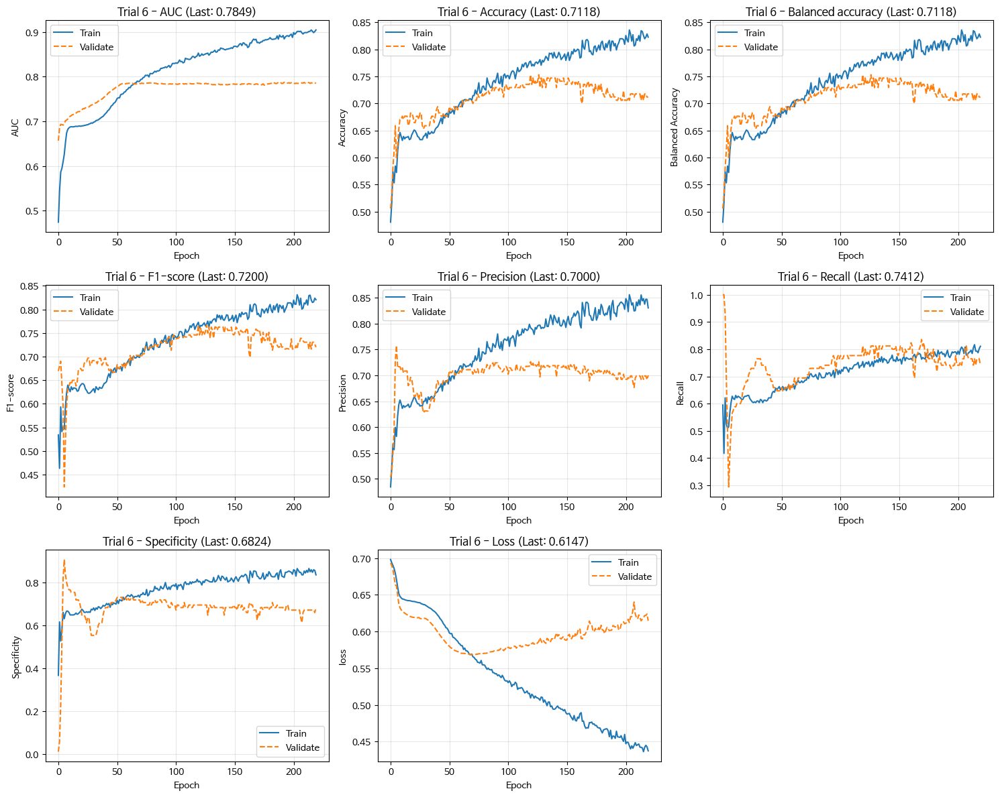

Training Progress:  22%|█████████████▍                                               | 220/1000 [03:41<13:04,  1.01s/it]


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

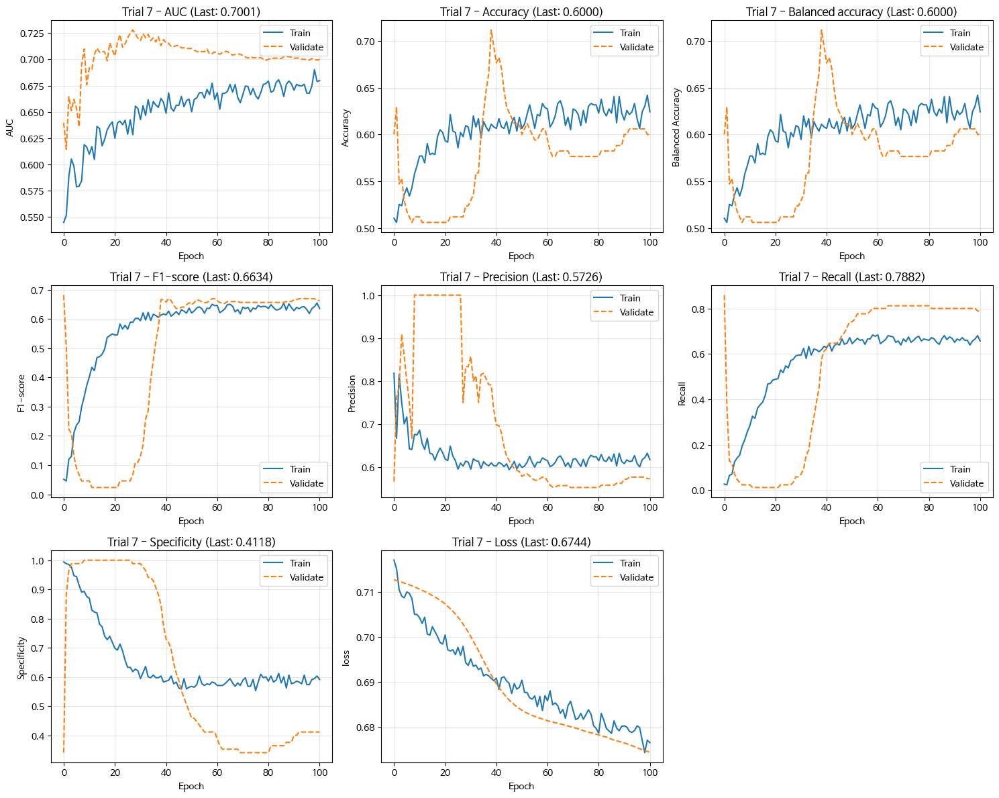

Training Progress:  10%|██████▏                                                      | 101/1000 [01:36<14:22,  1.04it/s]


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

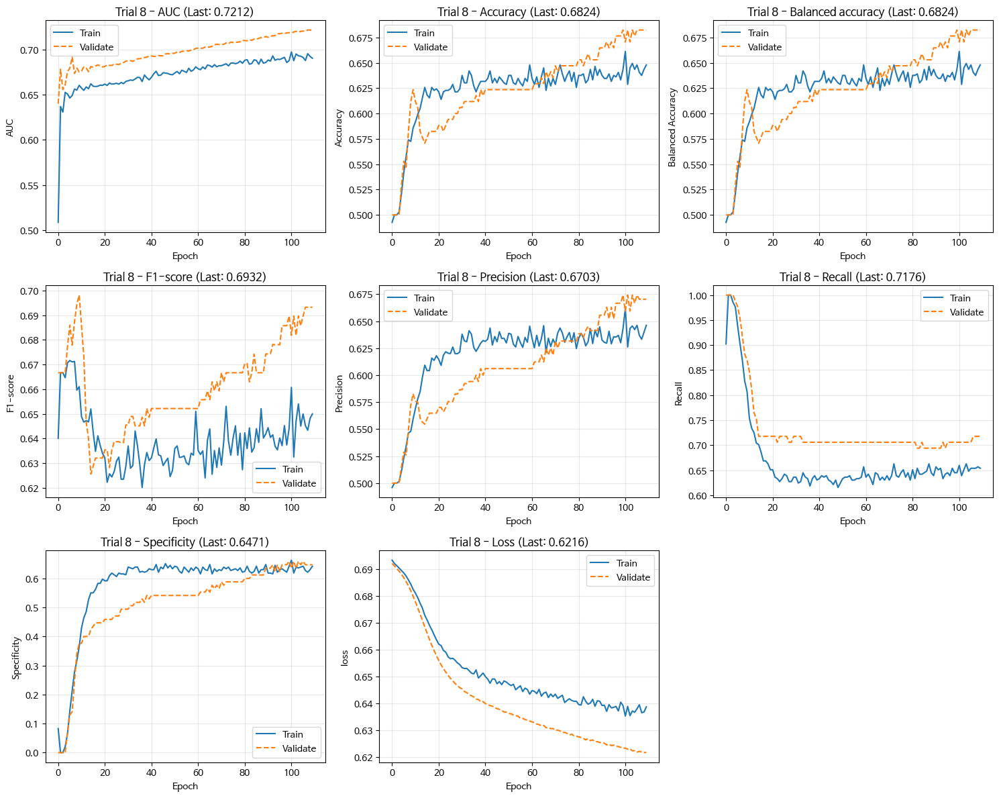

Training Progress:  11%|██████▋                                                      | 110/1000 [01:39<13:26,  1.10it/s]


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

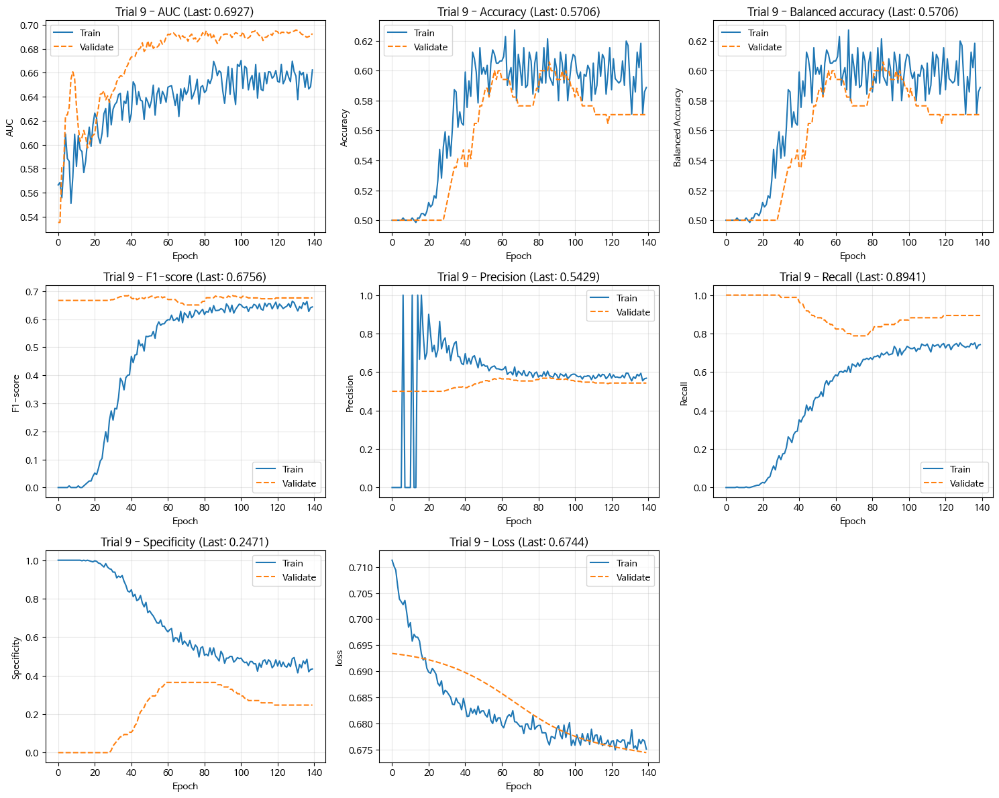

Training Progress:  14%|████████▌                                                    | 140/1000 [02:08<13:11,  1.09it/s]


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

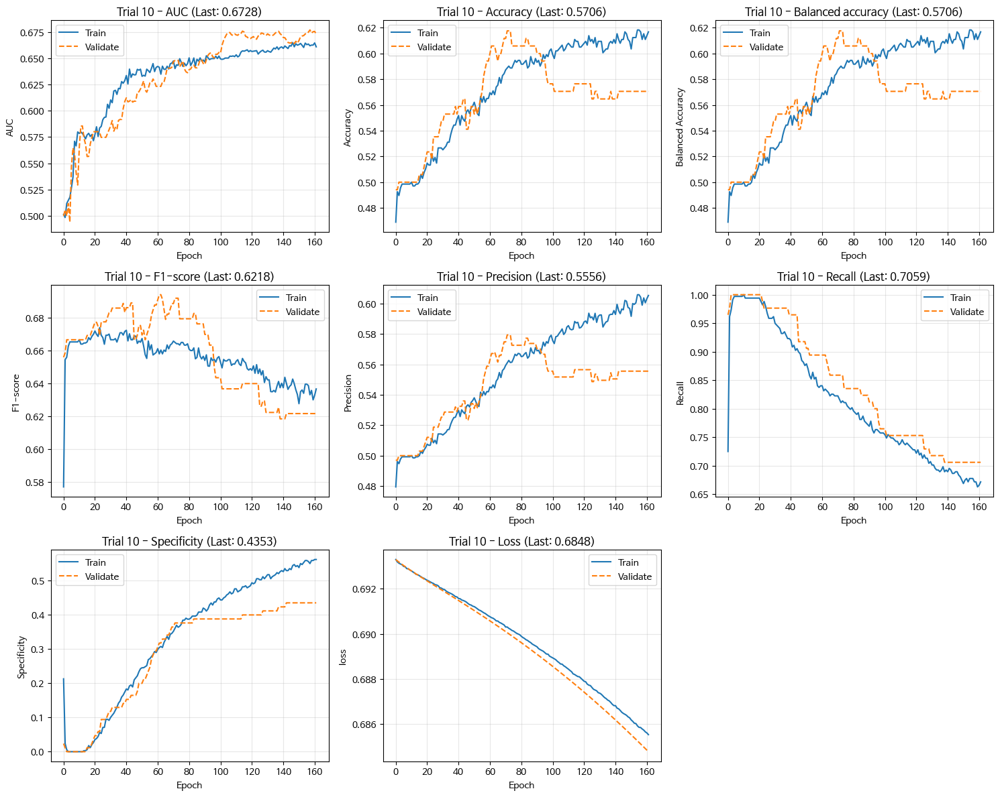

Training Progress:  16%|█████████▉                                                   | 162/1000 [02:36<13:28,  1.04it/s]

1/6 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

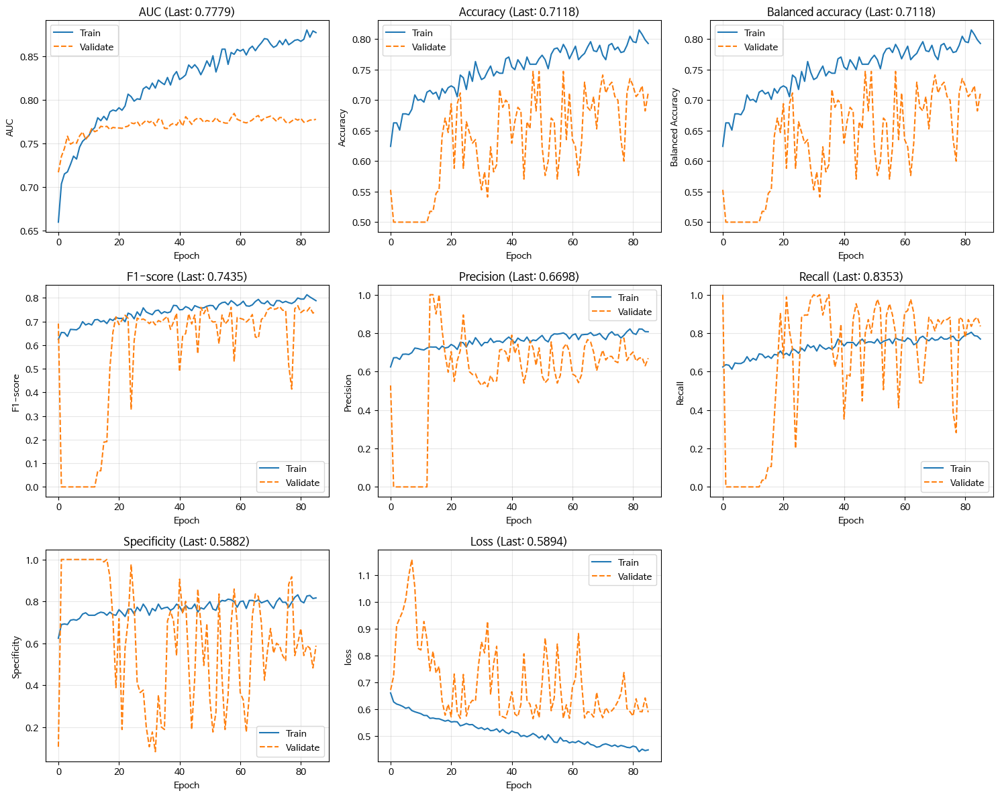

Training Progress:   9%|█████▎                                                        | 86/1000 [01:31<12:16,  1.24it/s]

In [ ]:
ALGO_NAMES_DL = ['CNN']

# DL 실행
results_DL, scores_DL = modeling_DL(
    algos=ALGO_NAMES_DL,
    X_train=X_train, Y_train=Y_train, X_test=X_test, Y_test=Y_test,
    node_list=None, # 특정 알고리즘
    validation_split=VALIDATION_SPLIT,
    validation_data=VALIDATION_DATA,
    tune_trials=TUNE_TRIALS_DL, # 최적화 여부
    cv_splits=CV_SPLITS,
    tune_metric=TUNE_METRIC_DL,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    earlystop_patient=None,
    shap_display=False,
    label_list=LABEL_LIST,
    random_state=RANDOM_STATE,
)

# Performance Summary

In [5]:
# Result Summary
folder_location = os.path.join(os.getcwd(),'Result')
scores = prediction_summary(
    folder_location=folder_location, 
    algonames=ALGO_NAMES_ML + ALGO_NAMES_DL,
    save_name=SAVE_NAME_PERFORMANCE,
)

### Performance Summary : 6 Algorithms ###

>>> [Train set] Performance Comparison


,Algorithm,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Logistic Regression,846,328,344,79,95,0.8059,0.7754,0.8132,0.7904,0.7943,0.7943,0.8757
1,Random Forest,846,423,423,0,0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,XGBoost,846,419,374,49,4,0.8953,0.9905,0.8842,0.9405,0.9374,0.9374,0.9922
3,LightGBM,846,413,411,12,10,0.9718,0.9764,0.9716,0.9741,0.9740,0.9740,0.9977
4,CatBoost,846,423,423,0,0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,MLP,846,384,401,22,39,0.9458,0.9078,0.9480,0.9264,0.9279,0.9279,0.9672



>>> [Validation(CV)] Performance Comparison


,Algorithm,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Logistic Regression,846,293,317,106,130,0.7474,0.6999,0.7636,0.7222,0.7317,0.7318,0.7978
1,Random Forest,846,306,335,88,117,0.7833,0.7473,0.7943,0.7645,0.7707,0.7708,0.8393
2,XGBoost,846,344,269,154,79,0.7213,0.8442,0.6737,0.7775,0.7589,0.7590,0.8355
3,LightGBM,846,311,320,103,112,0.7770,0.7638,0.7800,0.7698,0.7719,0.7719,0.8273
4,CatBoost,846,315,323,100,108,0.7706,0.7637,0.7730,0.7665,0.7683,0.7684,0.8431
5,MLP,170,60,65,20,25,0.7500,0.7059,0.7647,0.7273,0.7353,0.7353,0.8007



>>> [Test set] Performance Comparison


,Algorithm,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Logistic Regression,184,64,69,23,28,0.7356,0.6957,0.7500,0.7151,0.7228,0.7228,0.7916
1,Random Forest,184,68,74,18,24,0.7907,0.7391,0.8043,0.7640,0.7717,0.7717,0.8293
2,XGBoost,184,73,57,35,19,0.6759,0.7935,0.6196,0.7300,0.7065,0.7065,0.8030
3,LightGBM,184,67,67,25,25,0.7283,0.7283,0.7283,0.7283,0.7283,0.7283,0.8036
4,CatBoost,184,65,65,27,27,0.7065,0.7065,0.7065,0.7065,0.7065,0.7065,0.8046
5,MLP,184,60,69,23,32,0.7229,0.6522,0.7500,0.6857,0.7011,0.7011,0.7763



>>> [Entire population] Performance Comparison


,Algorithm,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Logistic Regression,1030,392,413,102,123,0.7935,0.7612,0.8019,0.7770,0.7816,0.7816,0.8607
1,Random Forest,1030,491,497,18,24,0.9646,0.9534,0.9650,0.9590,0.9592,0.9592,0.9934
2,XGBoost,1030,492,431,84,23,0.8542,0.9553,0.8369,0.9019,0.8961,0.8961,0.9666
3,LightGBM,1030,480,478,37,35,0.9284,0.9320,0.9282,0.9302,0.9301,0.9301,0.9734
4,CatBoost,1030,488,488,27,27,0.9476,0.9476,0.9476,0.9476,0.9476,0.9476,0.9888
5,MLP,1030,444,470,45,71,0.9080,0.8621,0.9126,0.8845,0.8874,0.8874,0.9390


# Best Model Prediction

▶ Searching Directory: /mnt/c/DataScience/Publication/202604_SuicidalIdeation_OldAdult/Model
Loading Model: Random Forest
   - File: best_model_Random Forest_20260614_010340.pkl
   - Successfully Loaded.
Performance: 


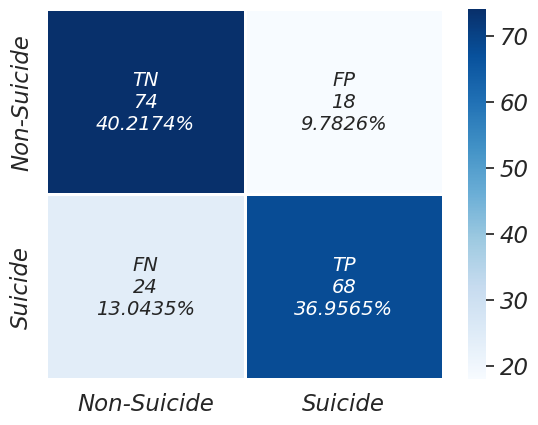

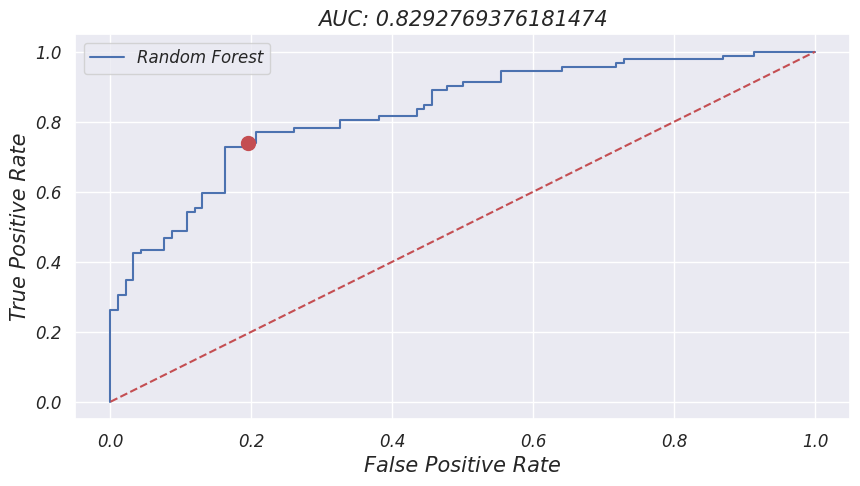

,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Random Forest,Train set,846,423,423,0,0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,Random Forest,Test set,184,68,74,18,24,0.7907,0.7391,0.8043,0.7640,0.7717,0.7717,0.8293
2,Random Forest,Entire population,1030,491,497,18,24,0.9646,0.9534,0.9650,0.9590,0.9592,0.9592,0.9934


In [9]:
# Model Loaded
if METRIC_FINAL in ['RMSE']:
    best_scoreidx = np.argmin(scores[scores.Dataset=='Test set'][METRIC_FINAL])
else:
    best_scoreidx = np.argmax(scores[scores.Dataset=='Test set'][METRIC_FINAL])
best_algo = scores[scores.Dataset=='Test set'].iloc[best_scoreidx]['Algorithm']
best_model, best_params = Loading_ModelBestParams(algo_name=best_algo)

# Performance Evaluation
if METRIC_FINAL in ['RMSE']:
    Scores_Test = prediction_reg(best_model, X_train, Y_train, X_test, Y_test,
                                 ALGO_NAME=best_algo, keras=False)
else:
    Scores_Test = prediction_class(best_model, X_train, Y_train, X_test, Y_test,
                                   LABEL_LIST=LABEL_LIST, ALGO_NAME=best_algo, keras=False)
display(Scores_Test)

# Explanation

▶ Detected Task Type: [ classification ] (Target: binary)

   Running Machine Learning Algorithm: Random Forest (classification)
Explanations...:  2026-06-15 13:35:55.384770
Loading existing SHAP values: ./Model/shap_values_Random Forest_20260614_220021.pkl
Loading existing SHAP interaction values: ./Model/shap_intervalues_Random Forest_20260614_225741.pkl

[Train Dataset Contribution Calculation]: 2026-06-15 13:36:06.842397
Feature Total Contribution (Calculating Metrics)...
Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 1957.72it/s]


,Feature,Importance,Importance Percentage,Contribution Range,"Ground Truth Correlation (Y, X)","Prediction Correlation (Y_hat, X)","Total Contribution Correlation (Y_shap, X)","Total Contribution Spearman Correlation (Y_shap, X)","Pure Main Effect Correlation (Y_pure, X)",Feature,Importance,Importance Percentage,Contribution Range,"Ground Truth Correlation (Y, X)","Prediction Correlation (Y_hat, X)","Total Contribution Correlation (Y_shap, X)","Total Contribution Spearman Correlation (Y_shap, X)","Pure Main Effect Correlation (Y_pure, X)"
0,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_대중교통 이용 시,0.0106,2.1838,0.0347,0.2787,0.3603,0.9468,0.6831,0.9959,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_상업시설 이용 시,0.0114,2.3512,0.0312,-0.2299,-0.2793,-0.8993,-0.7426,-0.9291
1,가구_근로소득_금액,0.0086,1.7773,0.0197,0.1193,0.1764,0.7407,0.7397,0.8112,좋은 죽음_임종시 가족이나 가까운 지인이 함께 하는 것,0.0108,2.2141,0.0249,-0.2216,-0.2646,-0.8278,-0.8280,-0.8786
2,중위소득 대비,0.0076,1.5613,0.0162,0.1743,0.2550,0.8303,0.8662,0.8734,지역사회 환경 만족도_주변 도로의 보행 안전,0.0093,1.9068,0.0189,-0.1555,-0.1929,-0.7875,-0.8003,-0.8512
3,가구_총수입액_금액,0.0072,1.4773,0.0144,0.1003,0.1675,0.6360,0.8672,0.7306,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_가족 내 주요 의사 결정시,0.0068,1.4079,0.0192,-0.1822,-0.2401,-0.8802,-0.7085,-0.9274
4,노인이 집에서 거주하기 위한 서비스 필요도_편리하게 생활할 수 있는 주거 환경 개선,0.0065,1.3274,0.0145,0.1631,0.1910,0.9358,0.8286,0.9808,가구ID,0.0056,1.1593,0.0117,-0.1215,-0.1559,-0.5467,-0.6410,-0.6255



[Test Dataset Contribution Calculation]: 2026-06-15 13:36:08.530588
Feature Total Contribution (Calculating Metrics)...
Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2421.63it/s]


,Feature,Importance,Importance Percentage,Contribution Range,"Ground Truth Correlation (Y, X)","Prediction Correlation (Y_hat, X)","Total Contribution Correlation (Y_shap, X)","Total Contribution Spearman Correlation (Y_shap, X)","Pure Main Effect Correlation (Y_pure, X)",Feature,Importance,Importance Percentage,Contribution Range,"Ground Truth Correlation (Y, X)","Prediction Correlation (Y_hat, X)","Total Contribution Correlation (Y_shap, X)","Total Contribution Spearman Correlation (Y_shap, X)","Pure Main Effect Correlation (Y_pure, X)"
0,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_대중교통 이용 시,0.0104,2.2338,0.0345,0.2801,0.4050,0.9729,0.6723,0.9992,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_상업시설 이용 시,0.0118,2.5279,0.0310,-0.2805,-0.3854,-0.9113,-0.7622,-0.9357
1,가구_근로소득_금액,0.0090,1.9350,0.0210,0.0713,0.1847,0.8542,0.7762,0.9068,좋은 죽음_임종시 가족이나 가까운 지인이 함께 하는 것,0.0103,2.2178,0.0243,-0.1058,-0.2523,-0.8760,-0.8760,-0.8828
2,중위소득 대비,0.0070,1.5001,0.0154,-0.0307,0.1372,0.8516,0.9080,0.8827,지역사회 환경 만족도_주변 도로의 보행 안전,0.0094,2.0150,0.0191,-0.1321,-0.1880,-0.8396,-0.8049,-0.8778
3,가구_총수입액_금액,0.0068,1.4628,0.0136,0.0683,0.1589,0.6997,0.8957,0.7572,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_가족 내 주요 의사 결정시,0.0069,1.4817,0.0198,-0.2060,-0.3374,-0.9250,-0.6998,-0.9338
4,노인이 집에서 거주하기 위한 서비스 필요도_편리하게 생활할 수 있는 주거 환경 개선,0.0066,1.4226,0.0150,0.0796,0.1879,0.9737,0.8279,0.9948,가구ID,0.0048,1.0260,0.0102,-0.1165,-0.2574,-0.7424,-0.6326,-0.8205



[Train Dataset Beeswarm Visualization]: 2026-06-15 13:36:08.932153
Total Explanation (Beeswarm + Importance Percentage & Correlation Bar)...


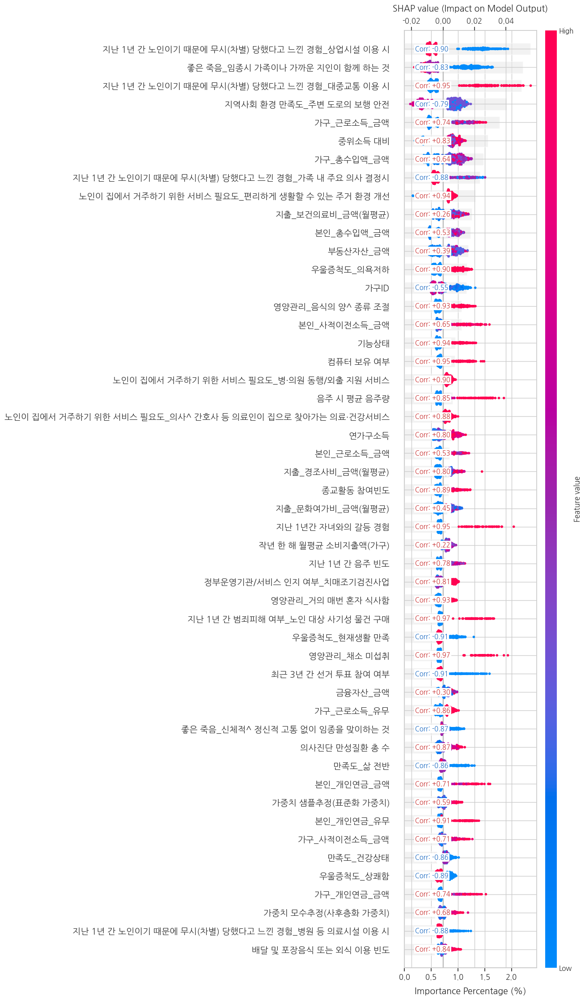


[Test Dataset Beeswarm Visualization]: 2026-06-15 13:36:09.873278
Total Explanation (Beeswarm + Importance Percentage & Correlation Bar)...


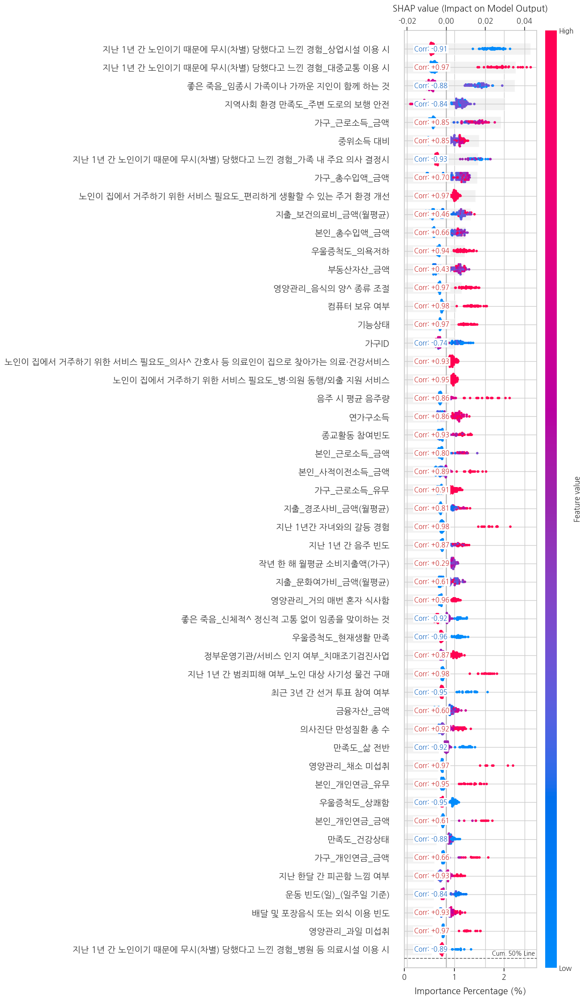


[Test Dataset Interaction]: 2026-06-15 13:36:10.569359
Feature Interactive Contribution...


Calculating Correlations: 100%|██████████████████████████████████████████████████████| 378/378 [00:03<00:00, 115.18it/s]


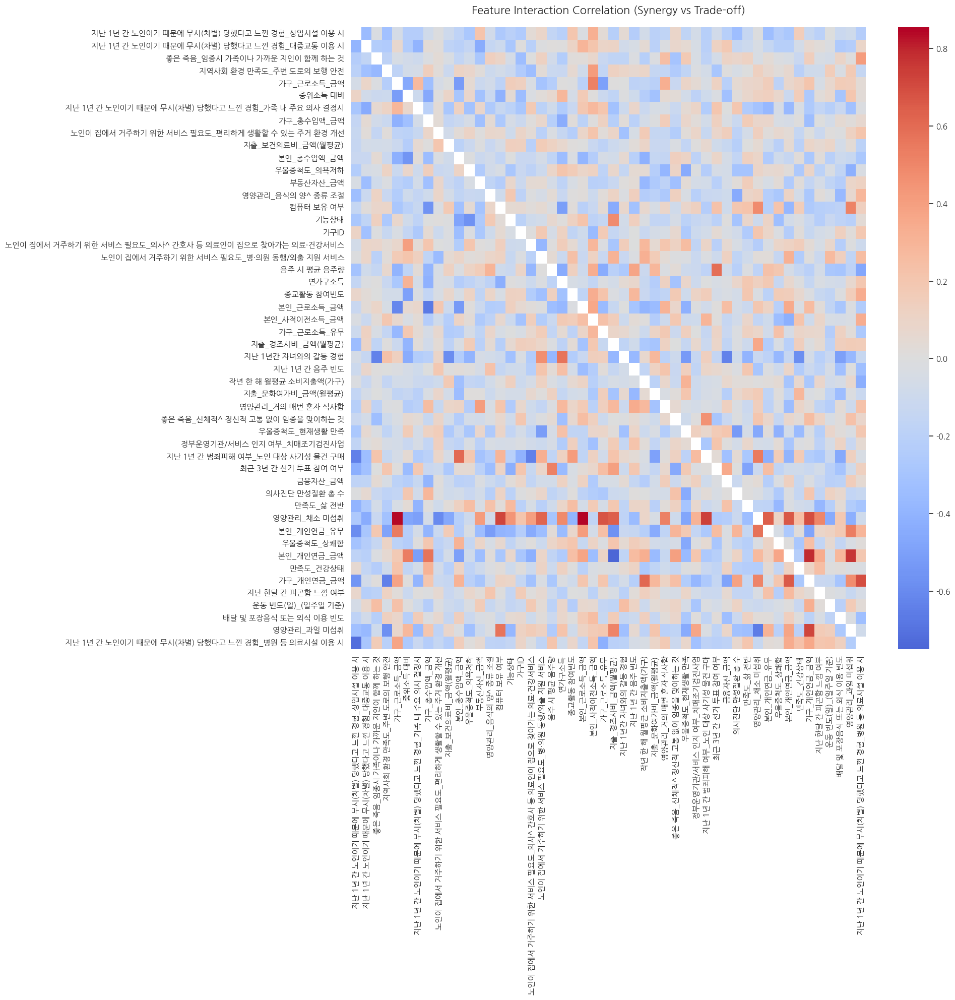


💡 Top 50 Feature Interaction Pairs (Impact Size & Direction)


,Feature 1,Feature 2,Impact Size (Magnitude),Interaction Correlation,Relationship
0,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_대중교통 이용 시,좋은 죽음_임종시 가족이나 가까운 지인이 함께 하는 것,0.0009,-0.2372,Trade-off (-)
1,지역사회 환경 만족도_주변 도로의 보행 안전,부동산자산_금액,0.0008,0.0195,Neutral
2,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_상업시설 이용 시,가구_근로소득_금액,0.0007,-0.0575,Neutral
3,노인이 집에서 거주하기 위한 서비스 필요도_의사^ 간호사 등 의료인이 집으로 찾아가는 의료·건강서비스,노인이 집에서 거주하기 위한 서비스 필요도_병·의원 동행/외출 지원 서비스,0.0006,-0.3811,Trade-off (-)
4,우울증척도_의욕저하,노인이 집에서 거주하기 위한 서비스 필요도_병·의원 동행/외출 지원 서비스,0.0006,-0.0997,Neutral
5,가구_근로소득_금액,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_가족 내 주요 의사 결정시,0.0006,0.2713,Synergy (+)
6,노인이 집에서 거주하기 위한 서비스 필요도_의사^ 간호사 등 의료인이 집으로 찾아가는 의료·건강서비스,연가구소득,0.0006,0.1477,Synergy (+)
7,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_상업시설 이용 시,좋은 죽음_임종시 가족이나 가까운 지인이 함께 하는 것,0.0006,-0.0282,Neutral
8,가구_총수입액_금액,기능상태,0.0006,-0.0485,Neutral
9,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_상업시설 이용 시,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_대중교통 이용 시,0.0005,-0.3580,Trade-off (-)



[Test Dataset Sensitivity Analysis]: 2026-06-15 13:36:20.016632
Sensitivity Analysis (ICE & PDP Plot) for Top 50 Features...
▶ [Warning] ICE Plot 생성 실패. 에러 메시지: 'super' object has no attribute '__sklearn_tags__'

[Train Dataset Individual]: 2026-06-15 13:36:21.207180
Individual Explanation(1 Decision Plot -> 1 Force Plot -> 1000 Force Plot)...
Visualizing random index: 441


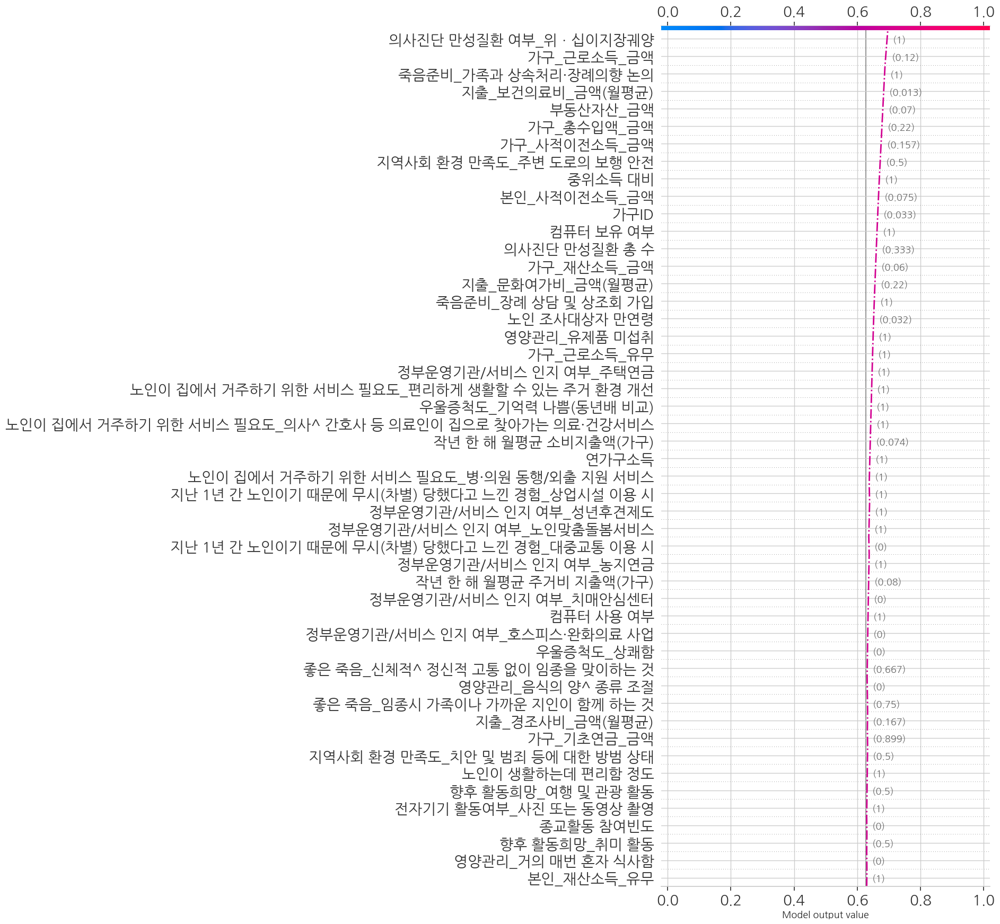


[Test Dataset Individual]: 2026-06-15 13:36:21.544492
Individual Explanation(1 Decision Plot -> 1 Force Plot -> 1000 Force Plot)...
Visualizing random index: 3


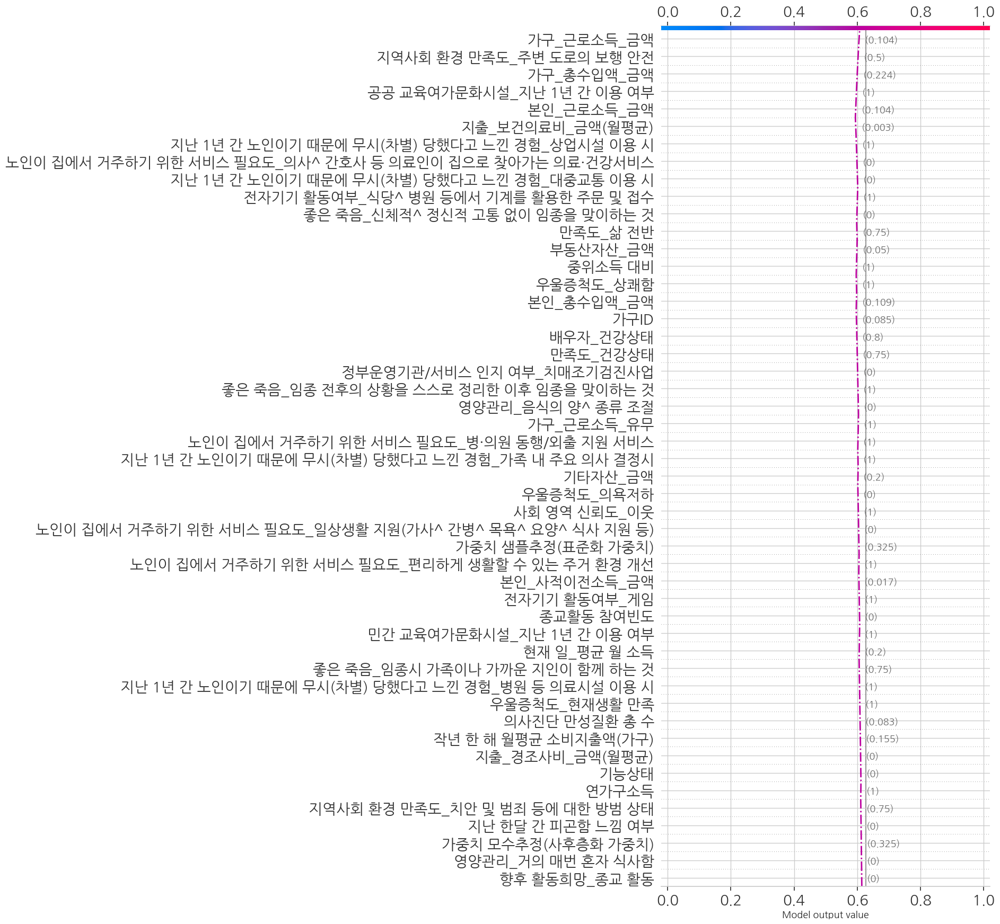

Performance Evaluations...:  2026-06-15 13:36:21.909406
Performance: 


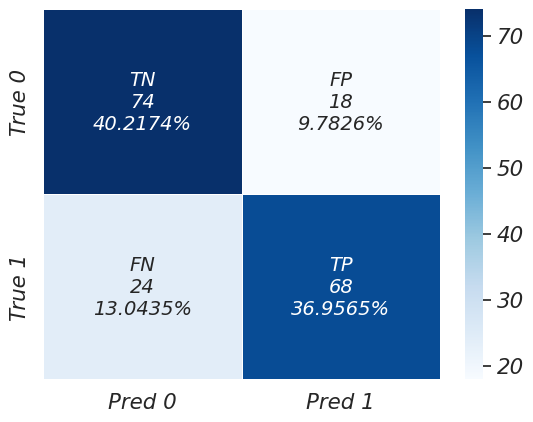

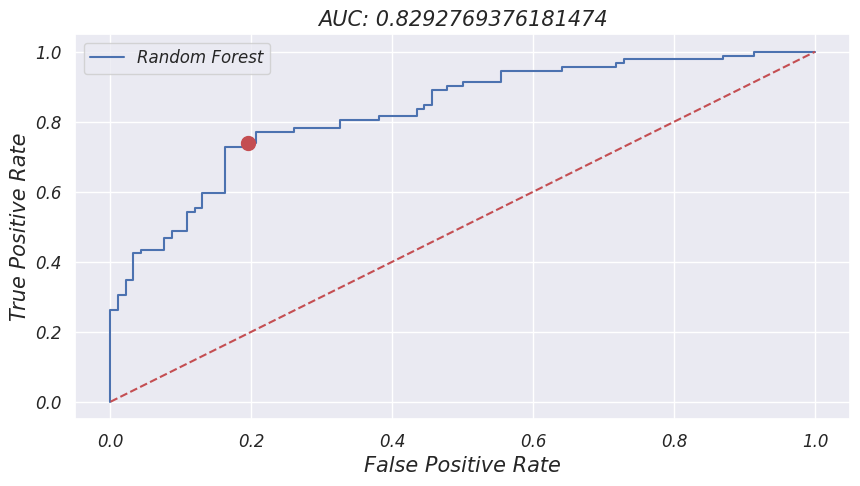

,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Random Forest,Train set,846,423,423,0,0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,Random Forest,Test set,184,68,74,18,24,0.7907,0.7391,0.8043,0.7640,0.7717,0.7717,0.8293
2,Random Forest,Entire population,1030,491,497,18,24,0.9646,0.9534,0.9650,0.9590,0.9592,0.9592,0.9934


Explanations...:  2026-06-15 13:36:22.604181
Loading existing SHAP values: ./Model/shap_values_Random Forest_20260614_220021.pkl
Loading existing SHAP interaction values: ./Model/shap_intervalues_Random Forest_20260614_225741.pkl

[Train Dataset Contribution Calculation]: 2026-06-15 13:36:34.430847
Feature Total Contribution (Calculating Metrics)...
Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2239.09it/s]


,Feature,Importance,Importance Percentage,Contribution Range,"Ground Truth Correlation (Y, X)","Prediction Correlation (Y_hat, X)","Total Contribution Correlation (Y_shap, X)","Total Contribution Spearman Correlation (Y_shap, X)","Pure Main Effect Correlation (Y_pure, X)",Feature,Importance,Importance Percentage,Contribution Range,"Ground Truth Correlation (Y, X)","Prediction Correlation (Y_hat, X)","Total Contribution Correlation (Y_shap, X)","Total Contribution Spearman Correlation (Y_shap, X)","Pure Main Effect Correlation (Y_pure, X)"
0,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_대중교통 이용 시,0.0106,2.1838,0.0347,0.2787,0.3603,0.9468,0.6831,0.9959,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_상업시설 이용 시,0.0114,2.3512,0.0312,-0.2299,-0.2793,-0.8993,-0.7426,-0.9291
1,가구_근로소득_금액,0.0086,1.7773,0.0197,0.1193,0.1764,0.7407,0.7397,0.8112,좋은 죽음_임종시 가족이나 가까운 지인이 함께 하는 것,0.0108,2.2141,0.0249,-0.2216,-0.2646,-0.8278,-0.8280,-0.8786
2,중위소득 대비,0.0076,1.5613,0.0162,0.1743,0.2550,0.8303,0.8662,0.8734,지역사회 환경 만족도_주변 도로의 보행 안전,0.0093,1.9068,0.0189,-0.1555,-0.1929,-0.7875,-0.8003,-0.8512
3,가구_총수입액_금액,0.0072,1.4773,0.0144,0.1003,0.1675,0.6360,0.8672,0.7306,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_가족 내 주요 의사 결정시,0.0068,1.4079,0.0192,-0.1822,-0.2401,-0.8802,-0.7085,-0.9274
4,노인이 집에서 거주하기 위한 서비스 필요도_편리하게 생활할 수 있는 주거 환경 개선,0.0065,1.3274,0.0145,0.1631,0.1910,0.9358,0.8286,0.9808,가구ID,0.0056,1.1593,0.0117,-0.1215,-0.1559,-0.5467,-0.6410,-0.6255



[Test Dataset Contribution Calculation]: 2026-06-15 13:36:36.185309
Feature Total Contribution (Calculating Metrics)...
Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 1899.64it/s]


,Feature,Importance,Importance Percentage,Contribution Range,"Ground Truth Correlation (Y, X)","Prediction Correlation (Y_hat, X)","Total Contribution Correlation (Y_shap, X)","Total Contribution Spearman Correlation (Y_shap, X)","Pure Main Effect Correlation (Y_pure, X)",Feature,Importance,Importance Percentage,Contribution Range,"Ground Truth Correlation (Y, X)","Prediction Correlation (Y_hat, X)","Total Contribution Correlation (Y_shap, X)","Total Contribution Spearman Correlation (Y_shap, X)","Pure Main Effect Correlation (Y_pure, X)"
0,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_대중교통 이용 시,0.0104,2.2338,0.0345,0.2801,0.4050,0.9729,0.6723,0.9992,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_상업시설 이용 시,0.0118,2.5279,0.0310,-0.2805,-0.3854,-0.9113,-0.7622,-0.9357
1,가구_근로소득_금액,0.0090,1.9350,0.0210,0.0713,0.1847,0.8542,0.7762,0.9068,좋은 죽음_임종시 가족이나 가까운 지인이 함께 하는 것,0.0103,2.2178,0.0243,-0.1058,-0.2523,-0.8760,-0.8760,-0.8828
2,중위소득 대비,0.0070,1.5001,0.0154,-0.0307,0.1372,0.8516,0.9080,0.8827,지역사회 환경 만족도_주변 도로의 보행 안전,0.0094,2.0150,0.0191,-0.1321,-0.1880,-0.8396,-0.8049,-0.8778
3,가구_총수입액_금액,0.0068,1.4628,0.0136,0.0683,0.1589,0.6997,0.8957,0.7572,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_가족 내 주요 의사 결정시,0.0069,1.4817,0.0198,-0.2060,-0.3374,-0.9250,-0.6998,-0.9338
4,노인이 집에서 거주하기 위한 서비스 필요도_편리하게 생활할 수 있는 주거 환경 개선,0.0066,1.4226,0.0150,0.0796,0.1879,0.9737,0.8279,0.9948,가구ID,0.0048,1.0260,0.0102,-0.1165,-0.2574,-0.7424,-0.6326,-0.8205



[Train Dataset Beeswarm Visualization]: 2026-06-15 13:36:36.917683
Total Explanation (Beeswarm + Importance Percentage & Correlation Bar)...


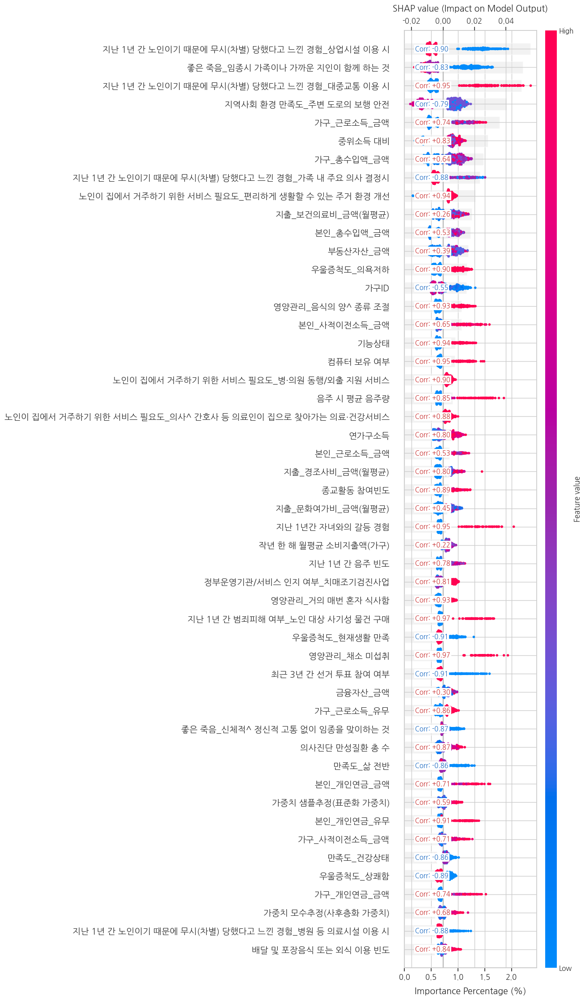


[Test Dataset Beeswarm Visualization]: 2026-06-15 13:36:38.022294
Total Explanation (Beeswarm + Importance Percentage & Correlation Bar)...


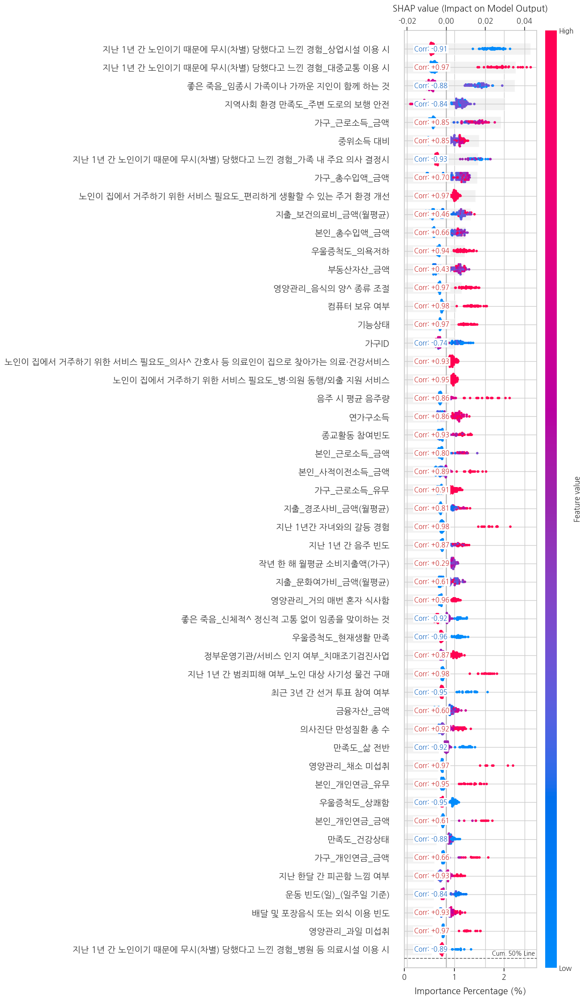


[Test Dataset Interaction]: 2026-06-15 13:36:38.822072
Feature Interactive Contribution...


Calculating Correlations: 100%|██████████████████████████████████████████████████████| 378/378 [00:03<00:00, 114.04it/s]


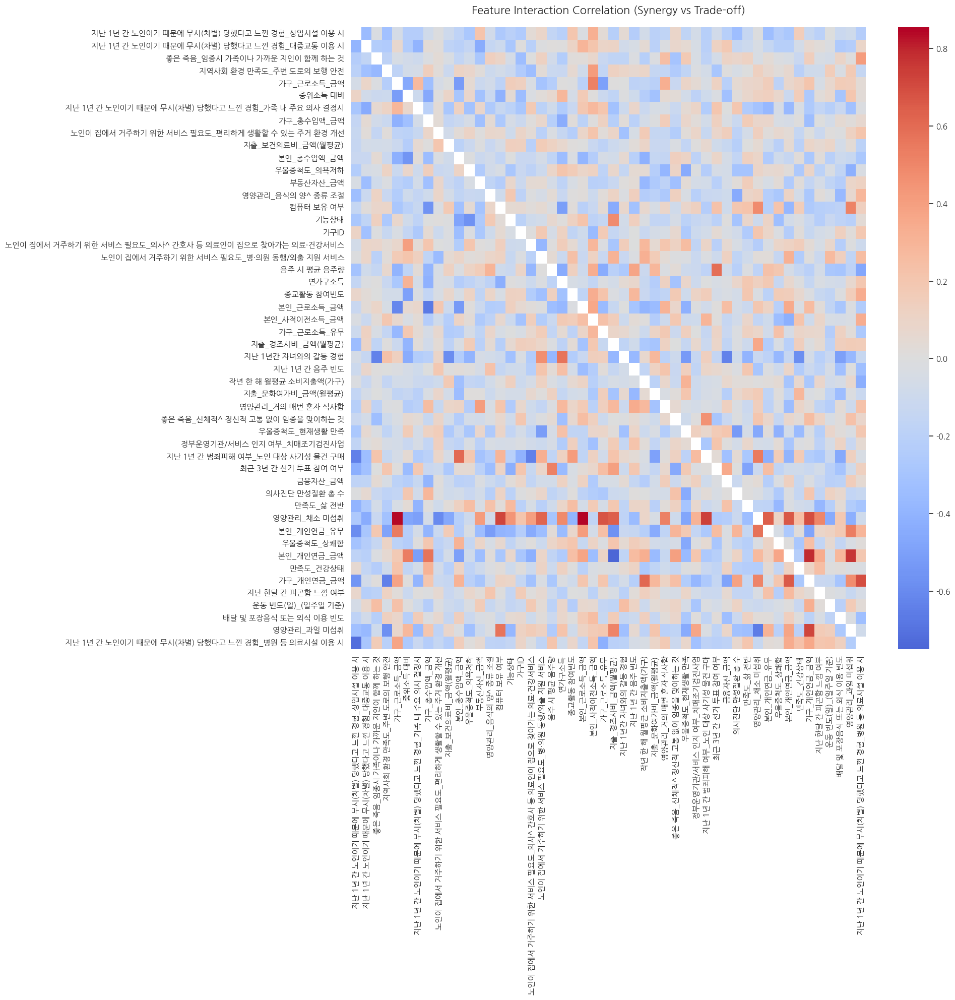


💡 Top 50 Feature Interaction Pairs (Impact Size & Direction)


,Feature 1,Feature 2,Impact Size (Magnitude),Interaction Correlation,Relationship
0,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_대중교통 이용 시,좋은 죽음_임종시 가족이나 가까운 지인이 함께 하는 것,0.0009,-0.2372,Trade-off (-)
1,지역사회 환경 만족도_주변 도로의 보행 안전,부동산자산_금액,0.0008,0.0195,Neutral
2,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_상업시설 이용 시,가구_근로소득_금액,0.0007,-0.0575,Neutral
3,노인이 집에서 거주하기 위한 서비스 필요도_의사^ 간호사 등 의료인이 집으로 찾아가는 의료·건강서비스,노인이 집에서 거주하기 위한 서비스 필요도_병·의원 동행/외출 지원 서비스,0.0006,-0.3811,Trade-off (-)
4,우울증척도_의욕저하,노인이 집에서 거주하기 위한 서비스 필요도_병·의원 동행/외출 지원 서비스,0.0006,-0.0997,Neutral
5,가구_근로소득_금액,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_가족 내 주요 의사 결정시,0.0006,0.2713,Synergy (+)
6,노인이 집에서 거주하기 위한 서비스 필요도_의사^ 간호사 등 의료인이 집으로 찾아가는 의료·건강서비스,연가구소득,0.0006,0.1477,Synergy (+)
7,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_상업시설 이용 시,좋은 죽음_임종시 가족이나 가까운 지인이 함께 하는 것,0.0006,-0.0282,Neutral
8,가구_총수입액_금액,기능상태,0.0006,-0.0485,Neutral
9,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_상업시설 이용 시,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_대중교통 이용 시,0.0005,-0.3580,Trade-off (-)



[Test Dataset Sensitivity Analysis]: 2026-06-15 13:36:48.251705
Sensitivity Analysis (ICE & PDP Plot) for Top 50 Features...
▶ [Warning] ICE Plot 생성 실패. 에러 메시지: 'super' object has no attribute '__sklearn_tags__'

[Train Dataset Individual]: 2026-06-15 13:36:48.404418
Individual Explanation(1 Decision Plot -> 1 Force Plot -> 1000 Force Plot)...
Visualizing random index: 441


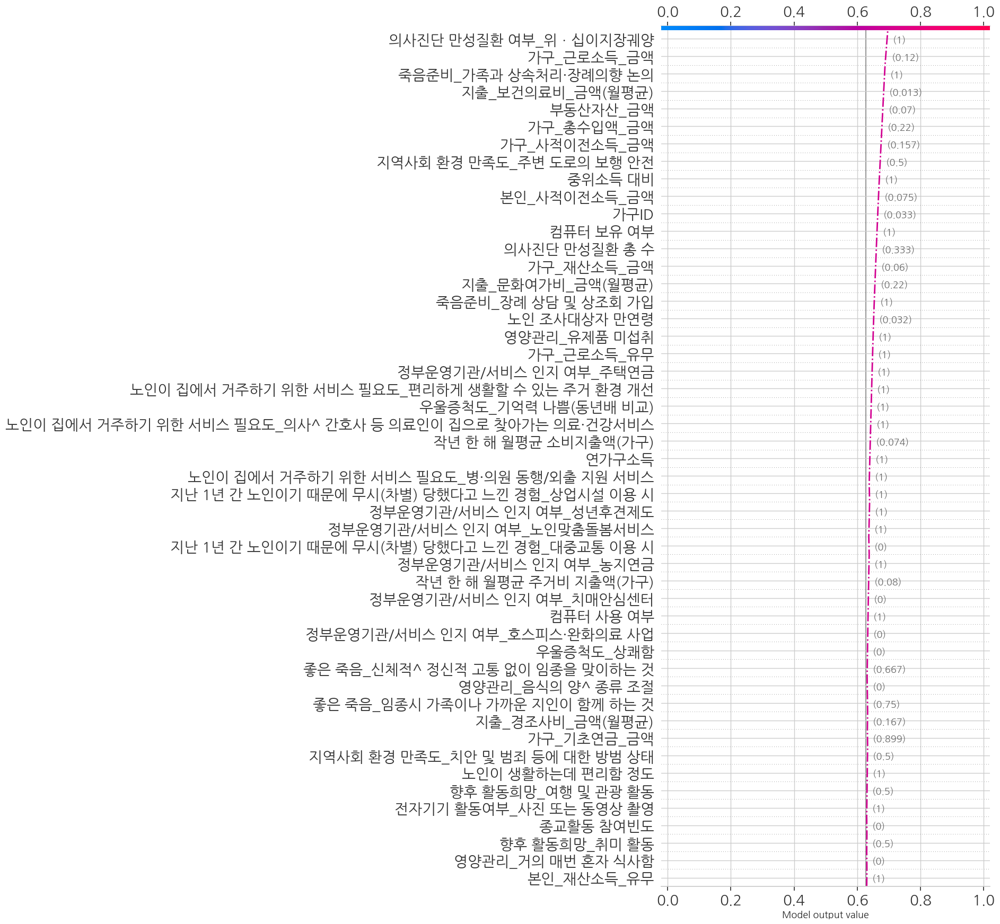


[Test Dataset Individual]: 2026-06-15 13:36:48.725663
Individual Explanation(1 Decision Plot -> 1 Force Plot -> 1000 Force Plot)...
Visualizing random index: 3


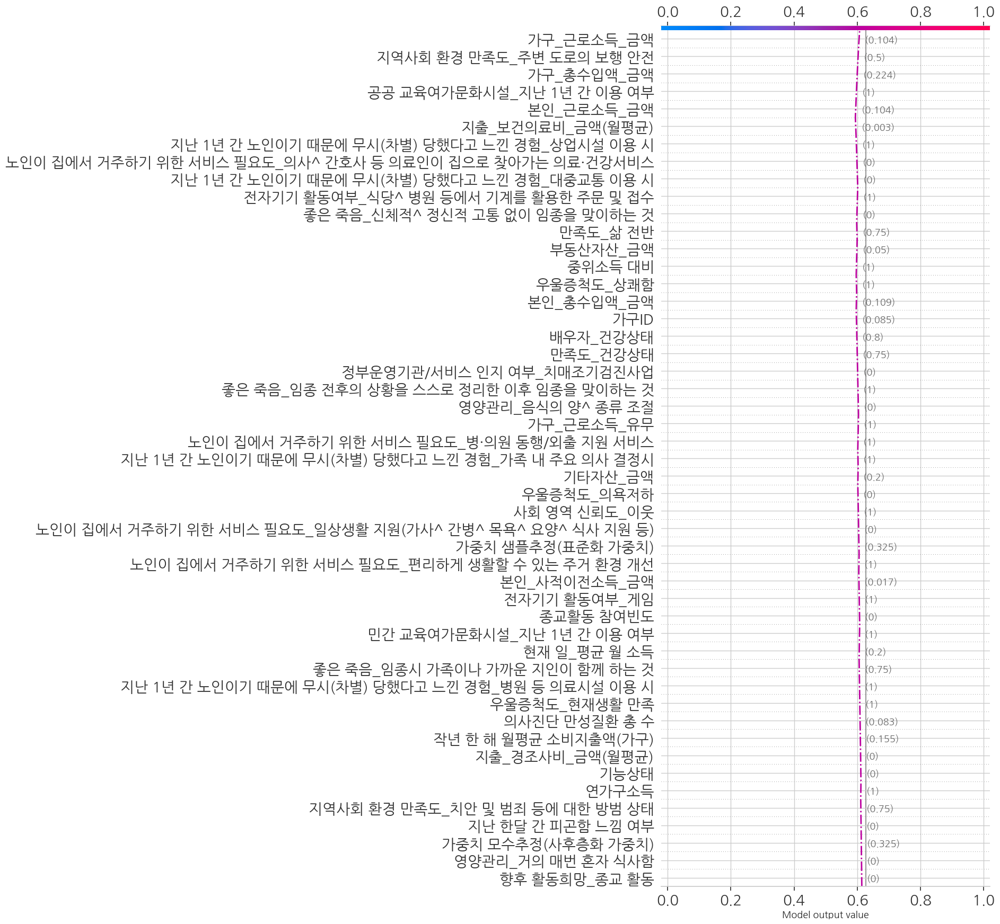

Performance Evaluations...:  2026-06-15 13:36:49.088541
Performance: 


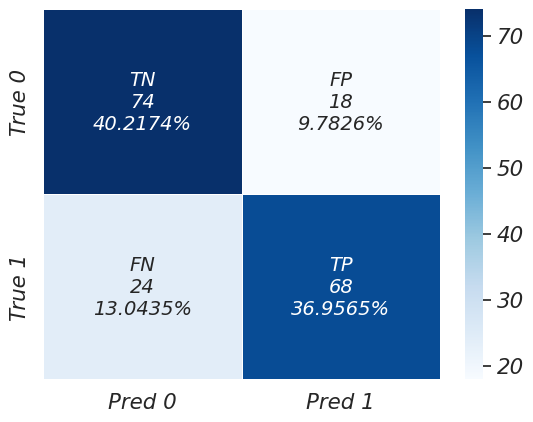

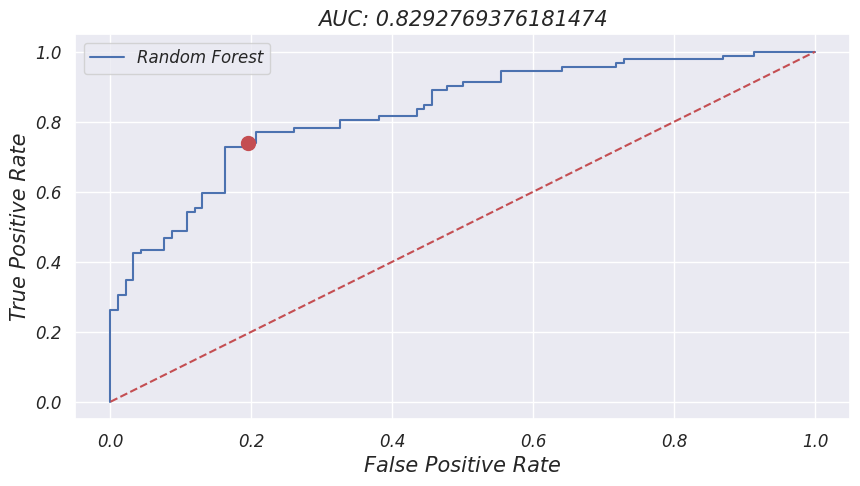

,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Random Forest,Train set,846,423,423,0,0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,Random Forest,Test set,184,68,74,18,24,0.7907,0.7391,0.8043,0.7640,0.7717,0.7717,0.8293
2,Random Forest,Entire population,1030,491,497,18,24,0.9646,0.9534,0.9650,0.9590,0.9592,0.9592,0.9934



   Modeling Completed. Summary of Performance (classification)


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Random Forest,Train set,846,423,423,0,0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
1,Random Forest,Test set,184,68,74,18,24,0.790698,0.739130,0.804348,0.764045,0.771739,0.771739,0.829277


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
2,Random Forest,Entire population,1030,491,497,18,24,0.964637,0.953398,0.965049,0.958984,0.959223,0.959223,0.993428


In [13]:
# Setting
ALGO_BEST = [best_algo]
params = best_params
TUNE_TRIALS = None
if best_algo in ALGO_NAMES_ML:
    TUNE_METRIC = TUNE_METRIC_ML
else:
    TUNE_METRIC = TUNE_METRIC_DL

# # Rename of Columns
# df_domain_rename = pd.read_excel(os.path.join(FOLDER_GDM, '[Rename_20251228].xlsx'), sheet_name='Features_SI')
# df_domain_rename = {i[0]:i[1] for i in df_domain_rename[['변수설명(한글)', '변수설명(영어)']].values}
# if LANGUAGE == 'kr':
#     X_selected = [col for col in X_colname if col in list(df_domain_rename.keys())]
# else:
#     X_selected = [df_rename[col] for col in X_colname if col in list(df_domain_rename.keys())]

# ML 실행
results_SHAP, scores_SHAP = modeling_ML(
    algos=ALGO_BEST,
    X_train=X_train, Y_train=Y_train, X_test=X_test, Y_test=Y_test,
    X_colname=X_colname, 
    scaler_dict=scaler_dict,
    params=params, # 특정 알고리즘
    tune_trials=TUNE_TRIALS, # 최적화 여부
    cv_splits=CV_SPLITS,
    tune_metric=TUNE_METRIC,
    shap=SHAP, 
    X_selected=None, # shap에서만 작동
    interaction=INTERACTION,
    interaction_samples=INTERACTION_SAMPLES, 
    interaction_batch=INTERACTION_BATCH,
    X_top_display=X_TOP_DISPLAY, 
    label_list=LABEL_LIST,
)

# Group Analysis


★★★ Subgroup Performance (Fairness) Evaluation: [노인 조사대상자 성별] ★★★
▶ [Info] '노인 조사대상자 성별' 변수를 scaler_dict를 통해 원본 스케일로 복원하여 조건을 판별합니다. (Male)
▶ [Info] '노인 조사대상자 성별' 변수를 scaler_dict를 통해 원본 스케일로 복원하여 조건을 판별합니다. (Female)


,Subgroup Target,Group Name,N,Precision,Recall,Specificity,F1-score,Accuracy,AUC
0,노인 조사대상자 성별,Male,71,0.7429,0.7879,0.7632,0.7647,0.7746,0.8620
1,노인 조사대상자 성별,Female,113,0.8235,0.7119,0.8333,0.7636,0.7699,0.8145



★★★ Subgroup Analysis Pipeline: 기준 변수 [노인 조사대상자 성별] ★★★
▶ Loading existing SHAP values: ./Model/shap_values_Random Forest_20260614_220021.pkl



################################################################################
🚀 실행 중인 데이터셋: [ Train Set ]
################################################################################

------------------------------------------------------------
### [Train Total] - Full Sample Rank & Direction Calculation ###
------------------------------------------------------------
Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2341.81it/s]



------------------------------------------------------------
### [노인 조사대상자 성별] - Male Group Analysis (Train Set) ###
------------------------------------------------------------
* 샘플 수 - Train: 313명

[Male] 1. Calculate Contributions (Train)
Feature Total Contribution (Calculating Metrics)...
Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2677.60it/s]



[Male] 2. Explanation Visualization (Train)
Total Explanation (Beeswarm + Importance Percentage & Correlation Bar)...


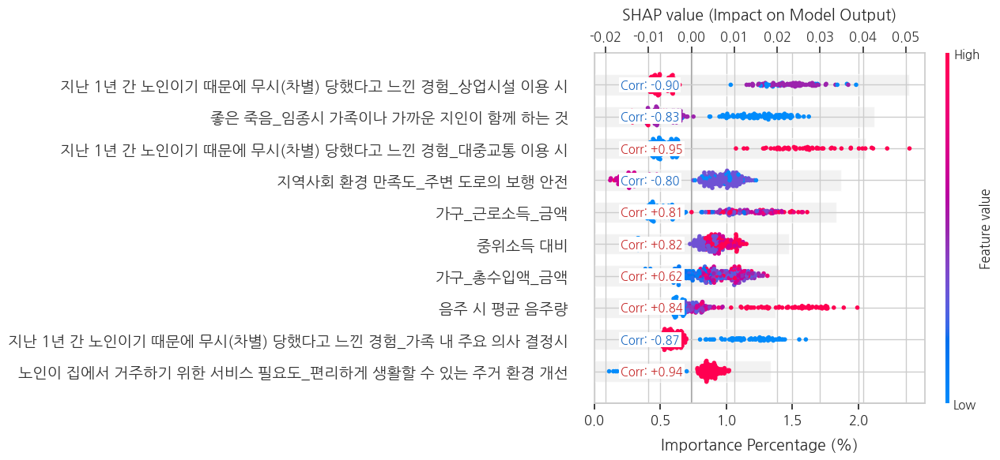

Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2537.24it/s]



------------------------------------------------------------
### [노인 조사대상자 성별] - Female Group Analysis (Train Set) ###
------------------------------------------------------------
* 샘플 수 - Train: 533명

[Female] 1. Calculate Contributions (Train)
Feature Total Contribution (Calculating Metrics)...
Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2360.79it/s]



[Female] 2. Explanation Visualization (Train)
Total Explanation (Beeswarm + Importance Percentage & Correlation Bar)...


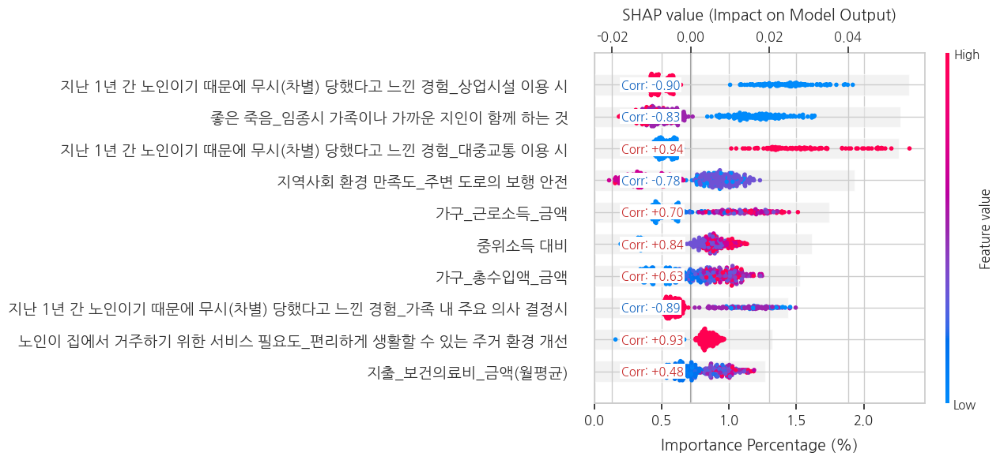

Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2410.77it/s]


### Group Rank & Direction Master Table (Train Set, Split by: 노인 조사대상자 성별) ###


,Feature,Rank_Total,DirectionPearson_Total,DirectionSpearman_Total,Rank_Male,DirectionPearson_Male,DirectionSpearman_Male,Rank_Female,DirectionPearson_Female,DirectionSpearman_Female
0,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_상업시설 이용 시,1,-0.8993,-0.7426,1,-0.8970,-0.7748,1,-0.9010,-0.7193
1,좋은 죽음_임종시 가족이나 가까운 지인이 함께 하는 것,2,-0.8278,-0.8280,2,-0.8311,-0.8344,2,-0.8265,-0.8223
2,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_대중교통 이용 시,3,0.9468,0.6831,3,0.9534,0.6592,3,0.9442,0.6962
3,지역사회 환경 만족도_주변 도로의 보행 안전,4,-0.7875,-0.8003,4,-0.7981,-0.7921,4,-0.7806,-0.8019
4,가구_근로소득_금액,5,0.7407,0.7397,5,0.8072,0.7903,5,0.6966,0.7026
5,중위소득 대비,6,0.8303,0.8662,6,0.8206,0.8449,6,0.8391,0.8776
6,가구_총수입액_금액,7,0.6360,0.8672,7,0.6197,0.8130,7,0.6349,0.8801
7,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_가족 내 주요 의사 결정시,8,-0.8802,-0.7085,9,-0.8694,-0.7063,8,-0.8862,-0.7097
8,노인이 집에서 거주하기 위한 서비스 필요도_편리하게 생활할 수 있는 주거 환경 개선,9,0.9358,0.8286,10,0.9382,0.8269,9,0.9349,0.8296
9,지출_보건의료비_금액(월평균),10,0.2579,0.9000,11,0.2301,0.8926,10,0.4789,0.9046



📈 Custom Bump Chart: 하위 집단 간 Feature 중요도 및 방향성 (Train Set)


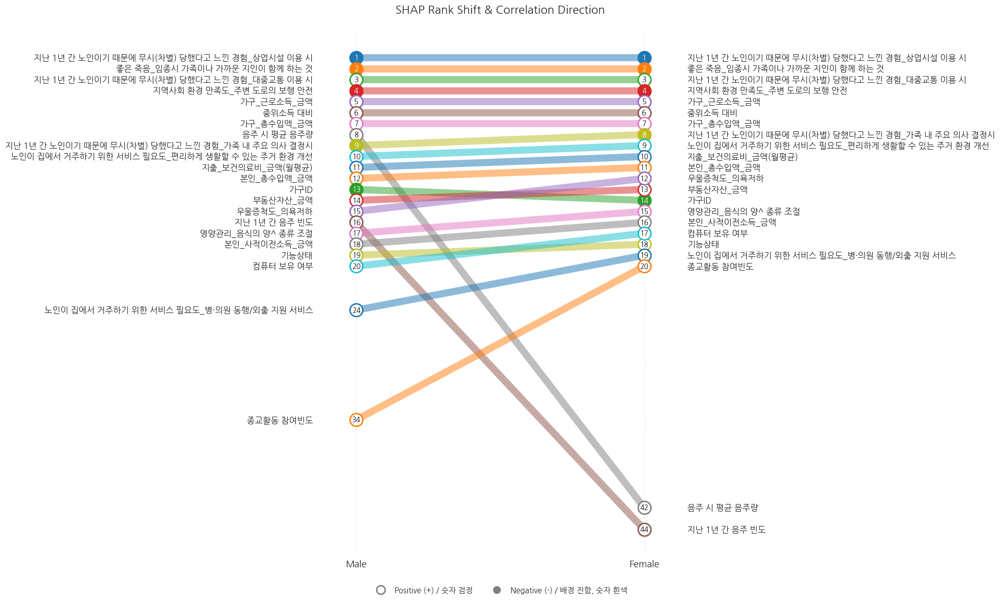


💡 [노인 조사대상자 성별] 기준 하위 집단 간 방향성 이견(Discordance) 리포트 (Train Set)

▶ Pearson Correlation 기준 엇갈리는 변수 (19개):
  - 작년 한 해 월평균 소비지출액(가구)
  - 연락 가능한 비동거 생존자녀 수
  - 정부운영기관/서비스 인지 여부_치매치료관리비 지원사업
  - 병의원^ 보건소 등 보건의료기관까지 걸리는 시간
  - 버스 정류장·지하철역까지 걸리는 시간
  - 정부운영기관/서비스 인지 여부_노인보호전문기관
  - 전자기기 활동여부_메시지 보내기
  - 지역사회 환경 만족도_상업시설 이용편의성
  - 집에서 인터넷 이용 가능 여부
  - 전자기기 활동여부_메시지 받기
  - 전자기기 활동여부_전자상거래
  - 지출_간병돌봄비_금액(월평균)
  - 가구_기타공적급여_유무
  - 본인_기타공적급여_유무
  - (장기요양) 현재 이용 서비스_방문요양
  - 의사진단 만성질환 여부_뇌졸중(중풍^ 뇌경색)
  - 영양관리_지난 6개월 간 의도치 않은 5kg이상의 체중변화
  - 의사진단 만성질환 여부_노인성 난청
  - 스마트워치 보유 여부
▶ Spearman Correlation 기준 엇갈리는 변수 (20개):
  - 1년전 몸무게
  - 몸무게
  - 노인 조사대상자 교육수준
  - 정부운영기관/서비스 인지 여부_독거노인·장애인 응급안전안심서비스
  - 정부운영기관/서비스 인지 여부_치매치료관리비 지원사업
  - 향후 활동희망_자원봉사 활동
  - 병의원^ 보건소 등 보건의료기관까지 걸리는 시간
  - 버스 정류장·지하철역까지 걸리는 시간
  - 전자기기 활동여부_메시지 보내기
  - 집에서 인터넷 이용 가능 여부
  - 전자기기 활동여부_메시지 받기
  - 전자기기 활동여부_전자상거래
  - 가구_기타공적급여_금액
  - 가구_기타공적급여_유무
  - 본인_기타공적급여_유무
  - 도움 주체_ 동거 가족
  - (장기요양) 현재 이용 서비스_방문요양
  - 의사진단 만성질환 여부_뇌졸중(중

Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2875.25it/s]



------------------------------------------------------------
### [노인 조사대상자 성별] - Male Group Analysis (Test Set) ###
------------------------------------------------------------
* 샘플 수 - Test: 71명

[Male] 1. Calculate Contributions (Test)
Feature Total Contribution (Calculating Metrics)...
Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2799.36it/s]



[Male] 2. Explanation Visualization (Test)
Total Explanation (Beeswarm + Importance Percentage & Correlation Bar)...


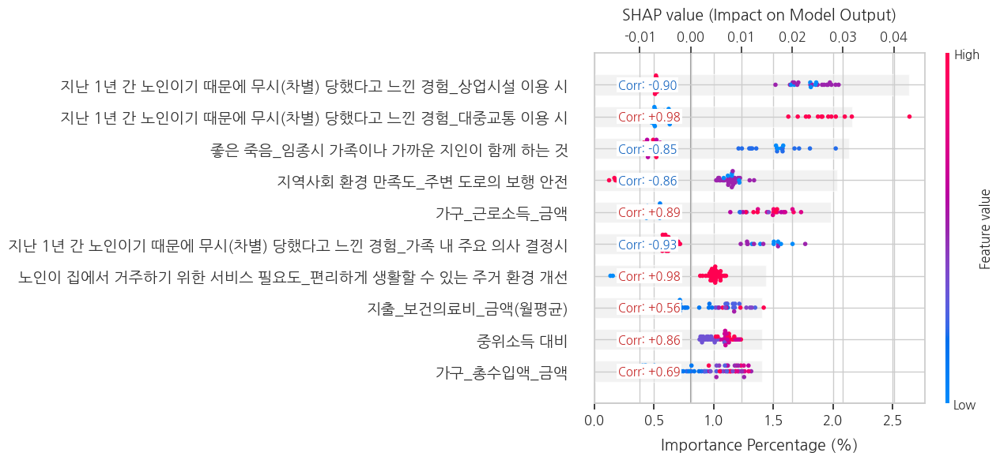

Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2741.58it/s]



------------------------------------------------------------
### [노인 조사대상자 성별] - Female Group Analysis (Test Set) ###
------------------------------------------------------------
* 샘플 수 - Test: 113명

[Female] 1. Calculate Contributions (Test)
Feature Total Contribution (Calculating Metrics)...
Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2533.66it/s]



[Female] 2. Explanation Visualization (Test)
Total Explanation (Beeswarm + Importance Percentage & Correlation Bar)...


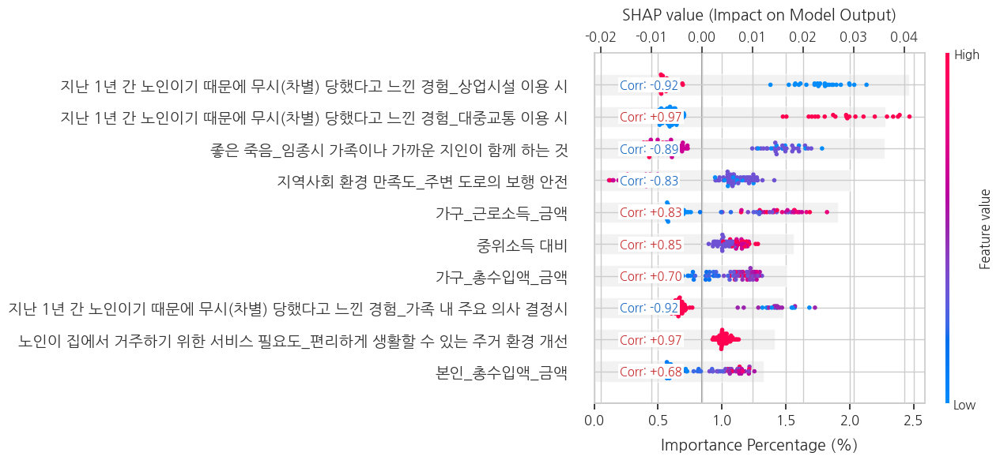

Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2817.69it/s]


### Group Rank & Direction Master Table (Test Set, Split by: 노인 조사대상자 성별) ###


,Feature,Rank_Total,DirectionPearson_Total,DirectionSpearman_Total,Rank_Male,DirectionPearson_Male,DirectionSpearman_Male,Rank_Female,DirectionPearson_Female,DirectionSpearman_Female
0,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_상업시설 이용 시,1,-0.9113,-0.7622,1,-0.9010,-0.7913,1,-0.9250,-0.7349
1,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_대중교통 이용 시,2,0.9729,0.6723,2,0.9768,0.6699,2,0.9712,0.6738
2,좋은 죽음_임종시 가족이나 가까운 지인이 함께 하는 것,3,-0.8760,-0.8760,3,-0.8512,-0.8164,3,-0.8901,-0.8959
3,지역사회 환경 만족도_주변 도로의 보행 안전,4,-0.8396,-0.8049,4,-0.8613,-0.8208,4,-0.8256,-0.7960
4,가구_근로소득_금액,5,0.8542,0.7762,5,0.8869,0.8032,5,0.8343,0.7613
5,중위소득 대비,6,0.8516,0.9080,9,0.8576,0.9114,6,0.8482,0.9103
6,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_가족 내 주요 의사 결정시,7,-0.9250,-0.6998,6,-0.9275,-0.7222,8,-0.9236,-0.6837
7,가구_총수입액_금액,8,0.6997,0.8957,10,0.6868,0.8601,7,0.7036,0.9110
8,노인이 집에서 거주하기 위한 서비스 필요도_편리하게 생활할 수 있는 주거 환경 개선,9,0.9737,0.8279,7,0.9784,0.8106,9,0.9717,0.8371
9,지출_보건의료비_금액(월평균),10,0.4632,0.9510,8,0.5601,0.9190,12,0.4424,0.9638



📈 Custom Bump Chart: 하위 집단 간 Feature 중요도 및 방향성 (Test Set)


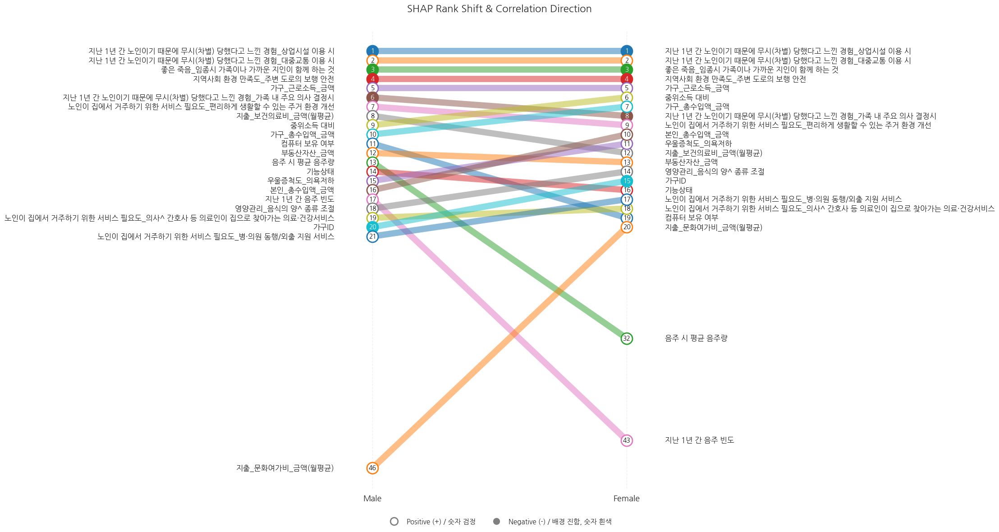


💡 [노인 조사대상자 성별] 기준 하위 집단 간 방향성 이견(Discordance) 리포트 (Test Set)

▶ Pearson Correlation 기준 엇갈리는 변수 (20개):
  - 작년 한 해 월평균 주거비 지출액(가구)
  - 가구_사업소득_금액
  - 본인_공적연금_금액
  - 현재 살고있는 주택에 대한 만족도
  - 정부운영기관/서비스 인지 여부_독거노인·장애인 응급안전안심서비스
  - 향후 활동희망_자원봉사 활동
  - 정부운영기관/서비스 인지 여부_치매치료관리비 지원사업
  - 버스 정류장·지하철역까지 걸리는 시간
  - 병의원^ 보건소 등 보건의료기관까지 걸리는 시간
  - 수면의 질
  - 정부운영기관/서비스 인지 여부_노인보호전문기관
  - 집에서 인터넷 이용 가능 여부
  - 전자기기 활동여부_금융거래
  - 지출_간병돌봄비_금액(월평균)
  - 본인_기타공적급여_금액
  - (장기요양) 현재 이용 서비스_방문요양
  - 도움 주체_ 장기요양보험서비스
  - 지출_간병돌봄비_유무
  - 가구_퇴직연금_유무
  - 가구_주택/농지연금_금액
▶ Spearman Correlation 기준 엇갈리는 변수 (23개):
  - 1년전 몸무게
  - 몸무게
  - 본인_공적연금_금액
  - 노인 조사대상자 교육수준
  - 정부운영기관/서비스 인지 여부_독거노인·장애인 응급안전안심서비스
  - 향후 활동희망_자원봉사 활동
  - 정부운영기관/서비스 인지 여부_치매치료관리비 지원사업
  - 지역사회 환경 만족도_이웃과의 교류기회
  - 병의원^ 보건소 등 보건의료기관까지 걸리는 시간
  - 도움 주체_ 비동거 가족
  - 일상생활의 불편함_이동
  - 전자기기 활동여부_금융거래
  - 가구_기타공적급여_금액
  - 본인_기타공적급여_금액
  - (장기요양) 현재 이용 서비스_방문요양
  - 도움 주체_ 장기요양보험서비스
  - 본인_주택/농지연금_금액
  - 지출_간병돌봄비_유무
  - 가구_퇴직연금_유무
  - 가구_주택/농지연금_금액
  - 의

In [19]:
# Sex
target_group = '노인 조사대상자 성별'
groups = {'Male': 1, 
          'Female': 2}
# key_features = [
#     'Felt unable to carry on/do anything',
#     'Satisfaction with family life',
#     'Family life causes me stress',
#     'Energy bill discount/subsidy (electricity, gas, etc.)', # 또는 'Energy bill discount/subsidy'
#     'Felt lonely',
#     'Everything felt difficult',
#     'Satisfaction with relationship with children',
#     'Satisfaction with job'
# ]
key_features=None

df_fairness_cash = evaluation_class_GroupFairness(
    best_model=best_model,
    target_col=target_group,
    groups_dict=groups,
    X_test=X_test, Y_test=Y_test, X_colname=X_colname,
    scaler_dict=scaler_dict
)

df_comp_train_cash, df_comp_test_cash = explanation_SHAP_groupcomparing(
    target_col=target_group,
    groups_dict=groups,
    X_train=X_train, X_test=X_test,
    X_colname=X_colname,
    scaler_dict=scaler_dict,
    best_algo=best_algo,
    max_display=10,
    save_csv=True,
    target_features=key_features
)

In [22]:
df_raw[target_group].unique()

array([3, 2, 1, 5, 4])


★★★ Subgroup Performance (Fairness) Evaluation: [연가구소득] ★★★
▶ [Info] '연가구소득' 변수를 scaler_dict를 통해 원본 스케일로 복원하여 조건을 판별합니다. (1)
▶ [Info] '연가구소득' 변수를 scaler_dict를 통해 원본 스케일로 복원하여 조건을 판별합니다. (2)
▶ [Info] '연가구소득' 변수를 scaler_dict를 통해 원본 스케일로 복원하여 조건을 판별합니다. (3)
▶ [Info] '연가구소득' 변수를 scaler_dict를 통해 원본 스케일로 복원하여 조건을 판별합니다. (4)
▶ [Info] '연가구소득' 변수를 scaler_dict를 통해 원본 스케일로 복원하여 조건을 판별합니다. (5)


,Subgroup Target,Group Name,N,Precision,Recall,Specificity,F1-score,Accuracy,AUC
0,연가구소득,1,30,0.7778,0.6364,0.8947,0.7000,0.8000,0.8278
1,연가구소득,2,33,0.7222,0.6842,0.6429,0.7027,0.6667,0.6917
2,연가구소득,3,41,0.8235,0.6364,0.8421,0.7179,0.7317,0.8014
3,연가구소득,4,47,0.7200,0.7826,0.7083,0.7500,0.7447,0.8062
4,연가구소득,5,33,0.9412,0.9412,0.9375,0.9412,0.9394,0.9779



★★★ Subgroup Analysis Pipeline: 기준 변수 [연가구소득] ★★★
▶ Loading existing SHAP values: ./Model/shap_values_Random Forest_20260614_220021.pkl



################################################################################
🚀 실행 중인 데이터셋: [ Train Set ]
################################################################################

------------------------------------------------------------
### [Train Total] - Full Sample Rank & Direction Calculation ###
------------------------------------------------------------
Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2266.16it/s]



------------------------------------------------------------
### [연가구소득] - 1 Group Analysis (Train Set) ###
------------------------------------------------------------
* 샘플 수 - Train: 174명

[1] 1. Calculate Contributions (Train)
Feature Total Contribution (Calculating Metrics)...
Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2905.93it/s]



[1] 2. Explanation Visualization (Train)
Total Explanation (Beeswarm + Importance Percentage & Correlation Bar)...


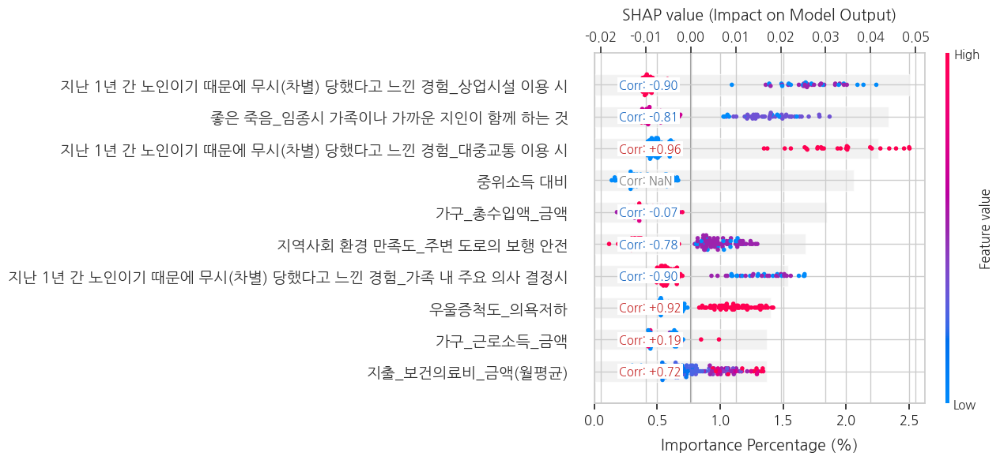

Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2442.81it/s]



------------------------------------------------------------
### [연가구소득] - 2 Group Analysis (Train Set) ###
------------------------------------------------------------
* 샘플 수 - Train: 171명

[2] 1. Calculate Contributions (Train)
Feature Total Contribution (Calculating Metrics)...
Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2724.79it/s]



[2] 2. Explanation Visualization (Train)
Total Explanation (Beeswarm + Importance Percentage & Correlation Bar)...


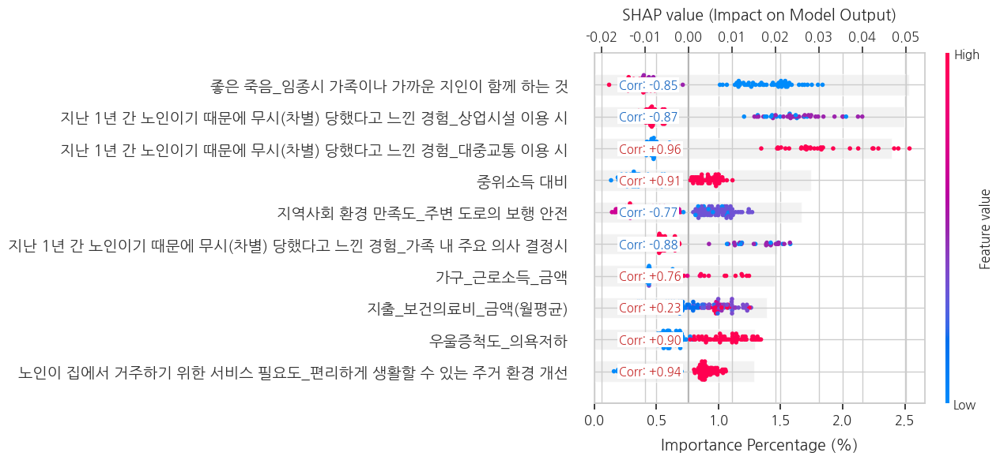

Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2662.81it/s]



------------------------------------------------------------
### [연가구소득] - 3 Group Analysis (Train Set) ###
------------------------------------------------------------
* 샘플 수 - Train: 174명

[3] 1. Calculate Contributions (Train)
Feature Total Contribution (Calculating Metrics)...
Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2822.33it/s]



[3] 2. Explanation Visualization (Train)
Total Explanation (Beeswarm + Importance Percentage & Correlation Bar)...


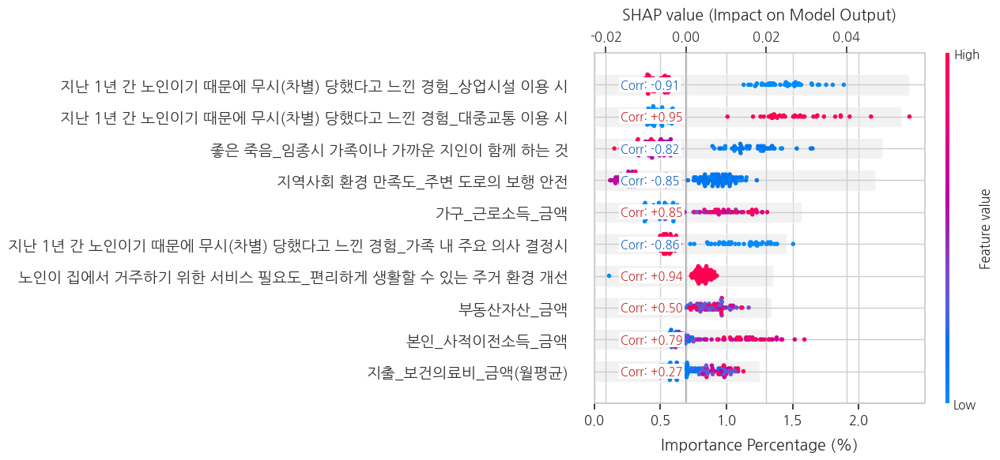

Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2774.86it/s]



------------------------------------------------------------
### [연가구소득] - 4 Group Analysis (Train Set) ###
------------------------------------------------------------
* 샘플 수 - Train: 158명

[4] 1. Calculate Contributions (Train)
Feature Total Contribution (Calculating Metrics)...
Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2674.77it/s]



[4] 2. Explanation Visualization (Train)
Total Explanation (Beeswarm + Importance Percentage & Correlation Bar)...


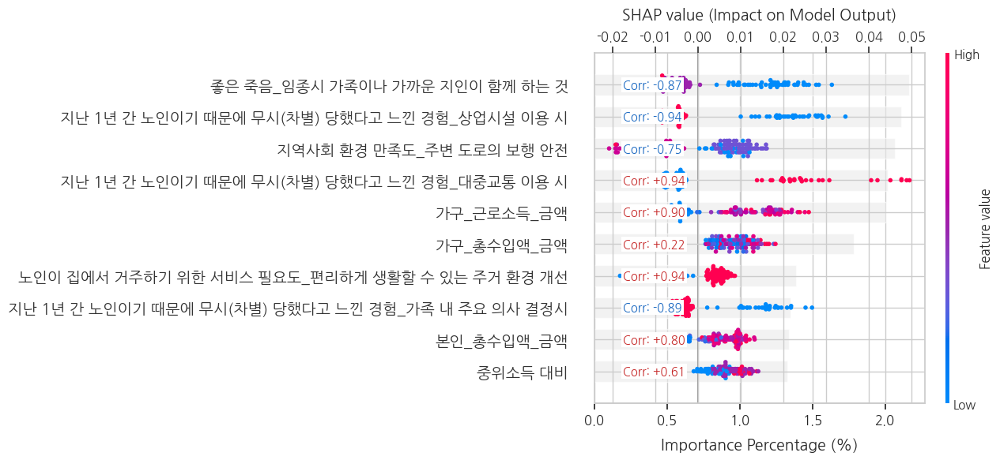

Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2791.50it/s]



------------------------------------------------------------
### [연가구소득] - 5 Group Analysis (Train Set) ###
------------------------------------------------------------
* 샘플 수 - Train: 169명

[5] 1. Calculate Contributions (Train)
Feature Total Contribution (Calculating Metrics)...
Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2693.42it/s]



[5] 2. Explanation Visualization (Train)
Total Explanation (Beeswarm + Importance Percentage & Correlation Bar)...


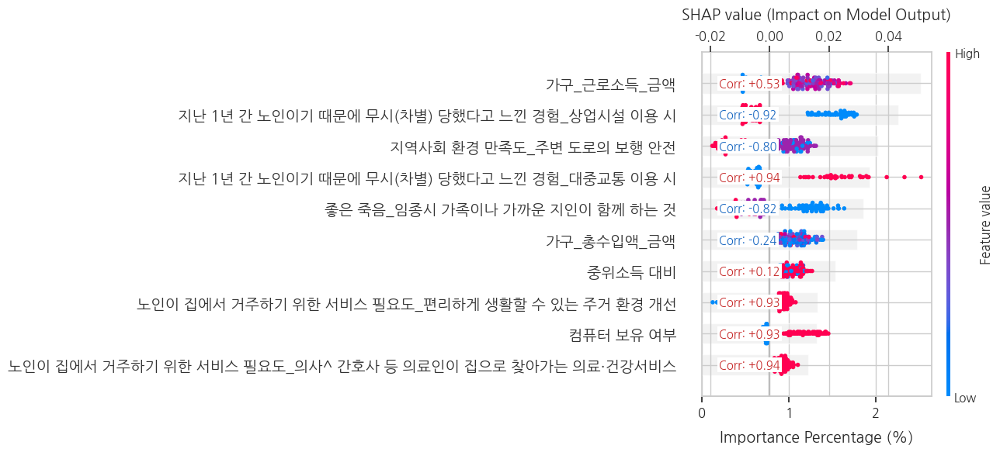

Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2676.13it/s]


### Group Rank & Direction Master Table (Train Set, Split by: 연가구소득) ###


,Feature,Rank_Total,DirectionPearson_Total,DirectionSpearman_Total,Rank_1,DirectionPearson_1,DirectionSpearman_1,Rank_2,DirectionPearson_2,DirectionSpearman_2,Rank_3,DirectionPearson_3,DirectionSpearman_3,Rank_4,DirectionPearson_4,DirectionSpearman_4,Rank_5,DirectionPearson_5,DirectionSpearman_5
0,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_상업시설 이용 시,1,-0.8993,-0.7426,1,-0.8985,-0.7095,2,-0.8694,-0.7343,1,-0.9118,-0.7315,2,-0.9433,-0.7458,2,-0.9165,-0.7830
1,좋은 죽음_임종시 가족이나 가까운 지인이 함께 하는 것,2,-0.8278,-0.8280,2,-0.8106,-0.7793,1,-0.8487,-0.8308,3,-0.8190,-0.8144,1,-0.8673,-0.8734,5,-0.8193,-0.8545
2,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_대중교통 이용 시,3,0.9468,0.6831,3,0.9627,0.6175,3,0.9623,0.6755,2,0.9535,0.7156,4,0.9351,0.6793,4,0.9398,0.7163
3,지역사회 환경 만족도_주변 도로의 보행 안전,4,-0.7875,-0.8003,6,-0.7844,-0.8109,5,-0.7687,-0.7871,4,-0.8487,-0.8404,3,-0.7531,-0.7632,3,-0.7957,-0.7740
4,가구_근로소득_금액,5,0.7407,0.7397,9,0.1900,0.0153,7,0.7574,0.3500,5,0.8501,0.6701,5,0.8953,0.8601,1,0.5347,0.5503
5,중위소득 대비,6,0.8303,0.8662,4,NaN,NaN,4,0.9098,0.8327,13,0.8292,0.7419,10,0.6083,0.6068,7,0.1216,0.0965
6,가구_총수입액_금액,7,0.6360,0.8672,5,-0.0746,-0.0660,12,0.6770,0.6524,36,0.5713,0.5336,6,0.2171,0.2121,6,-0.2373,-0.2161
7,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_가족 내 주요 의사 결정시,8,-0.8802,-0.7085,7,-0.8952,-0.6976,6,-0.8816,-0.6471,6,-0.8617,-0.7363,8,-0.8934,-0.6862,11,-0.8862,-0.7574
8,노인이 집에서 거주하기 위한 서비스 필요도_편리하게 생활할 수 있는 주거 환경 개선,9,0.9358,0.8286,12,0.9366,0.8092,10,0.9353,0.8129,7,0.9430,0.8473,7,0.9379,0.8285,8,0.9277,0.8375
9,지출_보건의료비_금액(월평균),10,0.2579,0.9000,10,0.7193,0.9265,8,0.2294,0.8946,10,0.2699,0.8974,13,0.4403,0.8914,12,0.5382,0.8937



📈 Custom Bump Chart: 하위 집단 간 Feature 중요도 및 방향성 (Train Set)


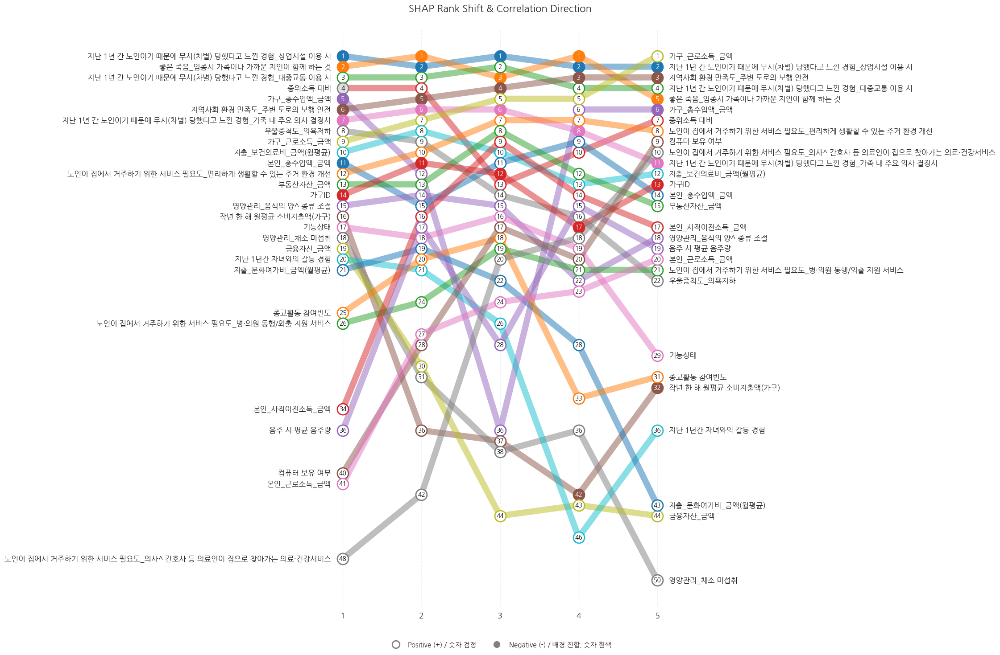


💡 [연가구소득] 기준 하위 집단 간 방향성 이견(Discordance) 리포트 (Train Set)

▶ Pearson Correlation 기준 엇갈리는 변수 (59개):
  - 가구_총수입액_금액
  - 본인_총수입액_금액
  - 작년 한 해 월평균 소비지출액(가구)
  - 작년 한 해 월평균 주거비 지출액(가구)
  - 현재 일_평균 월 소득
  - 향후 활동희망_여행 및 관광 활동
  - 노인 조사대상자 만연령
  - 가구_사업소득_금액
  - 본인_공적연금_금액
  - 가구 형태
  - 가구_재산소득_금액
  - 노인 조사대상자 교육수준
  - 본인_기초연금_금액
  - 정부운영기관/서비스 인지 여부_독거노인·장애인 응급안전안심서비스
  - 연락 가능한 비동거 생존자녀 수
  - 만족도_자녀와의 관계
  - 가구원수코드
  - 정부운영기관/서비스 인지 여부_치매치료관리비 지원사업
  - 노인가구형태
  - 향후 활동희망_자원봉사 활동
  - 병의원^ 보건소 등 보건의료기관까지 걸리는 시간
  - 버스 정류장·지하철역까지 걸리는 시간
  - 도움받을 수 있는 사람 수_몸이 아플 때
  - 수면의 질
  - 지역사회 환경 만족도_대중교통 이용편의성
  - 사회 영역 신뢰도_정부
  - 정부운영기관/서비스 인지 여부_노인보호전문기관
  - 지역사회 환경 만족도_공공기관 이용편의성
  - 지역사회 환경 만족도_상업시설 이용편의성
  - 주거 위치
  - 집에서 인터넷 이용 가능 여부
  - 거주형태(가구)
  - 가구_기초연금_유무
  - 전자기기 활동여부_게임
  - 힘듦 여부_도움 없이 300m 혼자 이동
  - 의사진단 만성질환 여부_당뇨병
  - 의사진단 만성질환 여부_요통^ 좌골신경통
  - 본인_기타소득_금액
  - 영양관리_하루 2끼 미만
  - 국민기초생활보장수급자 여부
  - 전자기기 활동여부_전자상거래
  - 전자기기 활동여부_금융거래
  - 가구_기타공적급여_금액
  - 지출_간병돌봄비_금액(월평균)
  - 전자기기 활동여부_소셜네트워

Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2610.14it/s]



------------------------------------------------------------
### [연가구소득] - 1 Group Analysis (Test Set) ###
------------------------------------------------------------
* 샘플 수 - Test: 30명

[1] 1. Calculate Contributions (Test)
Feature Total Contribution (Calculating Metrics)...
Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2939.16it/s]



[1] 2. Explanation Visualization (Test)
Total Explanation (Beeswarm + Importance Percentage & Correlation Bar)...


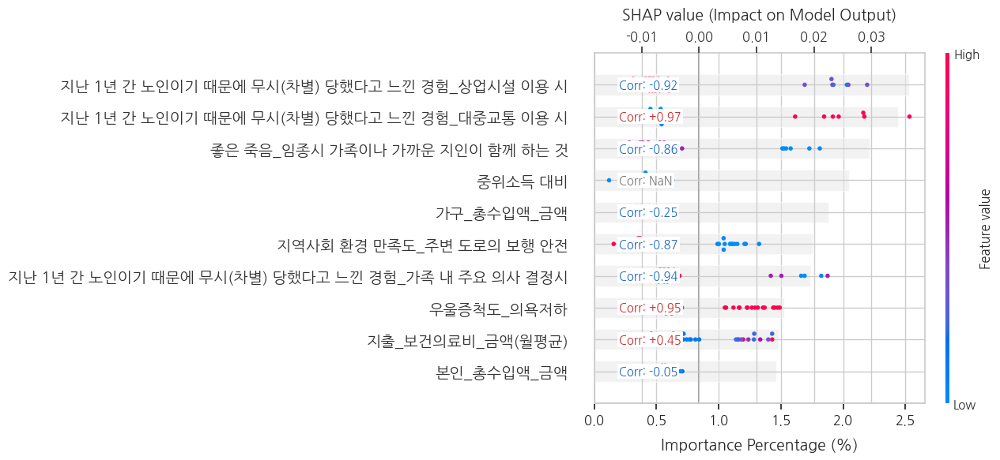

Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 3120.52it/s]



------------------------------------------------------------
### [연가구소득] - 2 Group Analysis (Test Set) ###
------------------------------------------------------------
* 샘플 수 - Test: 33명

[2] 1. Calculate Contributions (Test)
Feature Total Contribution (Calculating Metrics)...
Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2919.28it/s]



[2] 2. Explanation Visualization (Test)
Total Explanation (Beeswarm + Importance Percentage & Correlation Bar)...


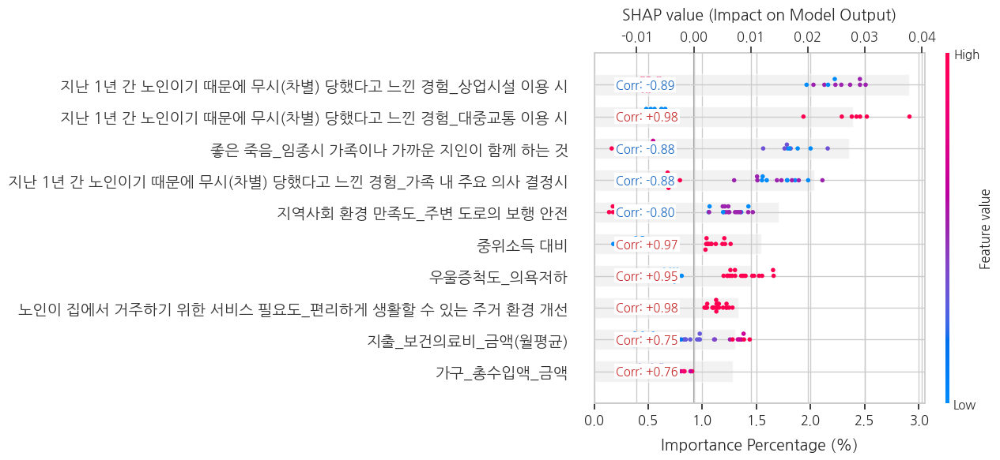

Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 2972.78it/s]



------------------------------------------------------------
### [연가구소득] - 3 Group Analysis (Test Set) ###
------------------------------------------------------------
* 샘플 수 - Test: 41명

[3] 1. Calculate Contributions (Test)
Feature Total Contribution (Calculating Metrics)...
Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 3167.08it/s]



[3] 2. Explanation Visualization (Test)
Total Explanation (Beeswarm + Importance Percentage & Correlation Bar)...


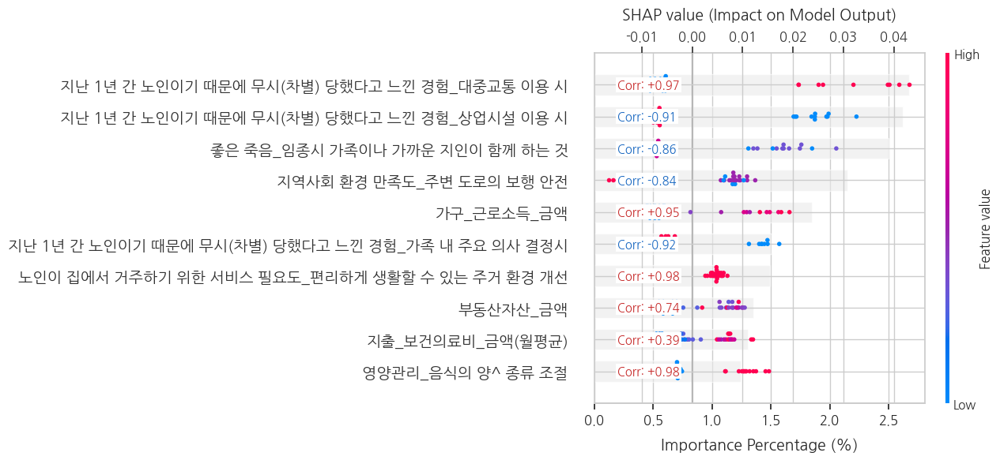

Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 3026.90it/s]



------------------------------------------------------------
### [연가구소득] - 4 Group Analysis (Test Set) ###
------------------------------------------------------------
* 샘플 수 - Test: 47명

[4] 1. Calculate Contributions (Test)
Feature Total Contribution (Calculating Metrics)...
Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 3061.19it/s]



[4] 2. Explanation Visualization (Test)
Total Explanation (Beeswarm + Importance Percentage & Correlation Bar)...


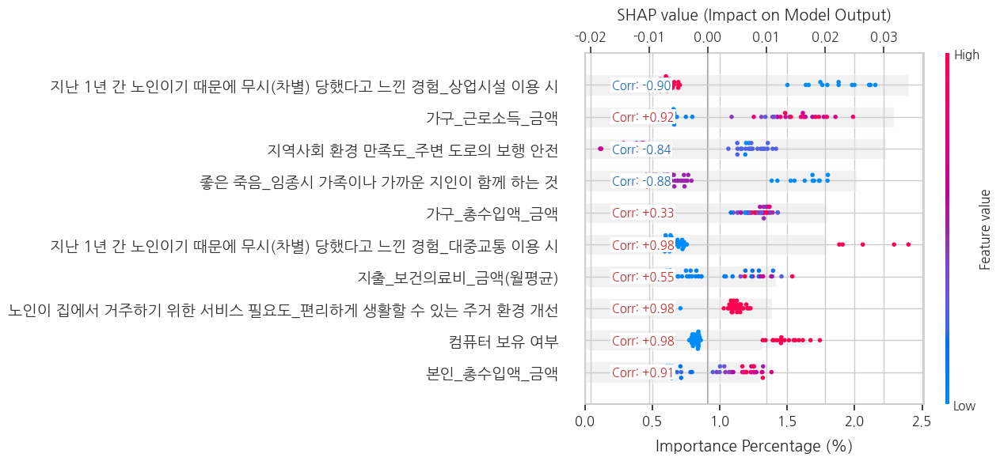

Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 3050.92it/s]



------------------------------------------------------------
### [연가구소득] - 5 Group Analysis (Test Set) ###
------------------------------------------------------------
* 샘플 수 - Test: 33명

[5] 1. Calculate Contributions (Test)
Feature Total Contribution (Calculating Metrics)...
Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 3371.92it/s]



[5] 2. Explanation Visualization (Test)
Total Explanation (Beeswarm + Importance Percentage & Correlation Bar)...


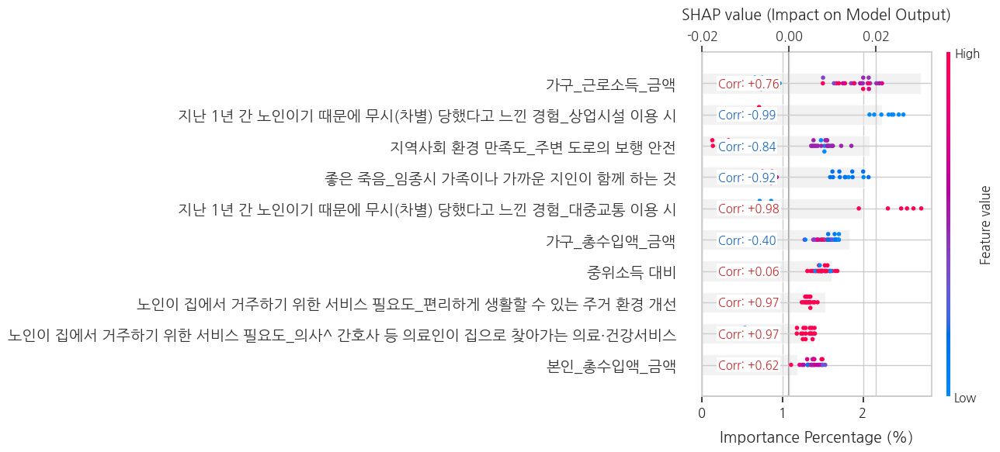

Feature Contribution Direction (Calculating Pearson & Spearman)...


Calculating 1D Directions: 100%|████████████████████████████████████████████████████| 378/378 [00:00<00:00, 3399.67it/s]


### Group Rank & Direction Master Table (Test Set, Split by: 연가구소득) ###


,Feature,Rank_Total,DirectionPearson_Total,DirectionSpearman_Total,Rank_1,DirectionPearson_1,DirectionSpearman_1,Rank_2,DirectionPearson_2,DirectionSpearman_2,Rank_3,DirectionPearson_3,DirectionSpearman_3,Rank_4,DirectionPearson_4,DirectionSpearman_4,Rank_5,DirectionPearson_5,DirectionSpearman_5
0,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_상업시설 이용 시,1,-0.9113,-0.7622,1,-0.9208,-0.7298,1,-0.8864,-0.7860,2,-0.9073,-0.7547,1,-0.9042,-0.7658,2,-0.9907,-0.7426
1,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_대중교통 이용 시,2,0.9729,0.6723,2,0.9749,0.7330,2,0.9823,0.7084,1,0.9680,0.7171,6,0.9830,0.5342,5,0.9808,0.6683
2,좋은 죽음_임종시 가족이나 가까운 지인이 함께 하는 것,3,-0.8760,-0.8760,3,-0.8565,-0.8360,3,-0.8842,-0.8421,3,-0.8620,-0.8809,4,-0.8780,-0.8872,4,-0.9189,-0.9200
3,지역사회 환경 만족도_주변 도로의 보행 안전,4,-0.8396,-0.8049,6,-0.8723,-0.8173,5,-0.8049,-0.7632,4,-0.8374,-0.7858,3,-0.8446,-0.7985,3,-0.8390,-0.7460
4,가구_근로소득_금액,5,0.8542,0.7762,12,0.0655,0.1052,11,0.6764,0.2032,5,0.9495,0.7766,2,0.9217,0.8707,1,0.7585,0.6029
5,중위소득 대비,6,0.8516,0.9080,4,NaN,NaN,6,0.9676,0.8467,11,0.8930,0.8396,11,0.7316,0.7607,7,0.0625,0.0244
6,지난 1년 간 노인이기 때문에 무시(차별) 당했다고 느낀 경험_가족 내 주요 의사 결정시,7,-0.9250,-0.6998,7,-0.9409,-0.6918,4,-0.8849,-0.8359,6,-0.9187,-0.6816,14,-0.9604,-0.5350,15,-0.9385,-0.5653
7,가구_총수입액_금액,8,0.6997,0.8957,5,-0.2512,-0.1954,10,0.7558,0.7382,43,0.7941,0.7877,5,0.3306,0.3538,6,-0.4026,-0.5074
8,노인이 집에서 거주하기 위한 서비스 필요도_편리하게 생활할 수 있는 주거 환경 개선,9,0.9737,0.8279,13,0.9673,0.8170,8,0.9787,0.8336,7,0.9813,0.8345,8,0.9760,0.7749,8,0.9653,0.8628
9,지출_보건의료비_금액(월평균),10,0.4632,0.9510,9,0.4519,0.9527,9,0.7516,0.9493,9,0.3860,0.9264,7,0.5509,0.9574,14,0.6713,0.9431



📈 Custom Bump Chart: 하위 집단 간 Feature 중요도 및 방향성 (Test Set)


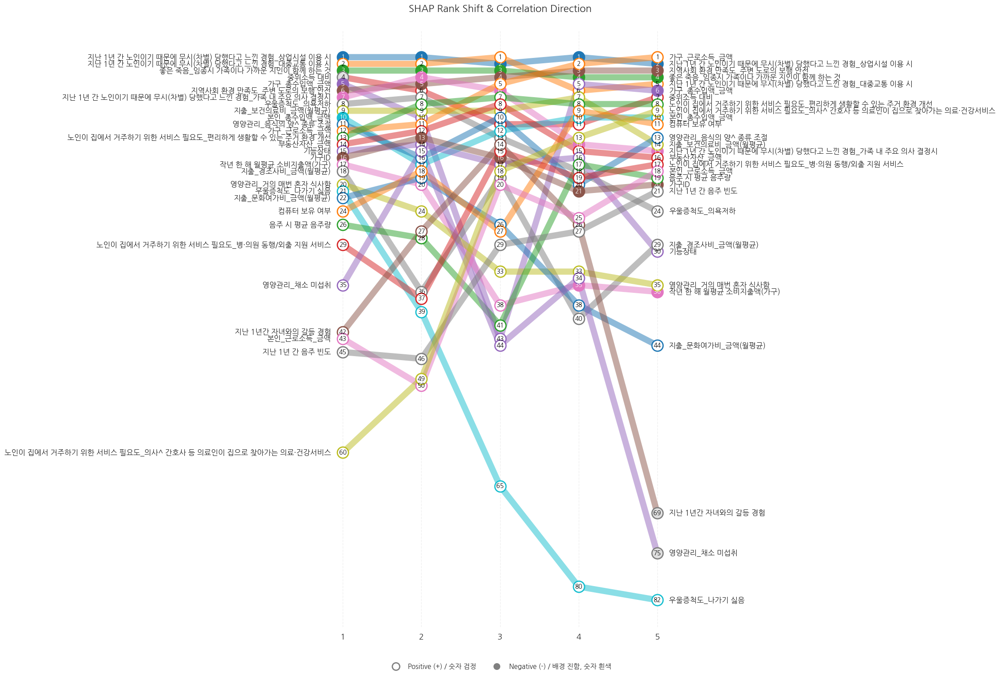


💡 [연가구소득] 기준 하위 집단 간 방향성 이견(Discordance) 리포트 (Test Set)

▶ Pearson Correlation 기준 엇갈리는 변수 (66개):
  - 가구_총수입액_금액
  - 본인_총수입액_금액
  - 작년 한 해 월평균 소비지출액(가구)
  - 본인_재산소득_금액
  - 작년 한 해 월평균 주거비 지출액(가구)
  - 향후 활동희망_여행 및 관광 활동
  - 가구_사업소득_금액
  - 본인_공적연금_금액
  - 가구 형태
  - 가구 내 사용하고 있는 방
  - 가구_재산소득_금액
  - 본인_기초연금_금액
  - 노인 조사대상자 교육년수
  - 현재 살고있는 주택에 대한 만족도
  - 노인가구형태
  - 만족도_자녀와의 관계
  - 가구원수코드
  - 정부운영기관/서비스 인지 여부_독거노인·장애인 응급안전안심서비스
  - 연락 가능한 비동거 생존자녀 수
  - 향후 활동희망_자원봉사 활동
  - 도움받을 수 있는 사람 수_우울할 때
  - 정부운영기관/서비스 인지 여부_치매치료관리비 지원사업
  - 도움받을 수 있는 사람 수_몸이 아플 때
  - 버스 정류장·지하철역까지 걸리는 시간
  - 지역사회 환경 만족도_이웃과의 교류기회
  - 병의원^ 보건소 등 보건의료기관까지 걸리는 시간
  - 수면의 질
  - 만족도_친구 및 지역사회 관계
  - 사회 영역 신뢰도_정부
  - 정부운영기관/서비스 인지 여부_노인보호전문기관
  - 지역사회 환경 만족도_공공기관 이용편의성
  - 지역사회 환경 만족도_상업시설 이용편의성
  - 주거 위치
  - 가구_기초연금_유무
  - 도움 주체_ 비동거 가족
  - 집에서 인터넷 이용 가능 여부
  - 의사진단 만성질환 여부_당뇨병
  - 힘듦 여부_도움 없이 300m 혼자 이동
  - 일상생활의 불편함_이동
  - [생성변수] 인지기능 저하 여부(1.5sd 기준)
  - 전자기기 활동여부_메시지 받기
  - 의사진단 만성질환 여부_요통^ 좌골신경통
  - 가구_기타소득_유무
  - 영양관리

In [24]:
# 연가구소득
target_group = '연가구소득'
groups = {
    '1': 1,
    '2': 2,
    '3': 3,
    '4': 4,
    '5': 5,
}
# key_features = [
#     'Felt unable to carry on/do anything',
#     'Satisfaction with family life',
#     'Family life causes me stress',
#     'Energy bill discount/subsidy (electricity, gas, etc.)', # 또는 'Energy bill discount/subsidy'
#     'Felt lonely',
#     'Everything felt difficult',
#     'Satisfaction with relationship with children',
#     'Satisfaction with job'
# ]
key_features=None

df_fairness = evaluation_class_GroupFairness(
    best_model=best_model,
    target_col=target_group,
    groups_dict=groups,
    X_test=X_test, Y_test=Y_test, X_colname=X_colname,
    scaler_dict=scaler_dict
)

df_comp_train, df_comp_test = explanation_SHAP_groupcomparing(
    target_col=target_group,
    groups_dict=groups,
    X_train=X_train, X_test=X_test,
    X_colname=X_colname,
    scaler_dict=scaler_dict,
    best_algo=best_algo,
    max_display=10,
    save_csv=True,
    target_features=key_features
)